# Оглавление

   [Описание проекта](#project_description)
1. [Знакомство с данными](#familiarity)
    * 1.1 [Открываем файл](#open_file)
    * 1.2 [Изучаем общую информацию](#first_info)


2. [Предобработка данных](#preprocessing)


3. [Анализ данных](#data_analysis)
    * 3.1 [Категории заведений](#category)
    * 3.2 [Количество посадочных мест](#seats)
    * 3.3 [Сетевые и несетевые заведения](#chain_restaurant)
    * 3.4 [Топ-15 популярных сетей](#top_15)    
    * 3.5 [Административные районы Москвы](#districts)       
    * 3.6 [Средние рейтинги по категориям заведений](#rating)
    * 3.7 [Средние рейтинги по округам](#rating_district)  
    * 3.8 [Улицы с наибольшим количеством заведений](#top15_streets)  
    * 3.9 [Улицы с единственным заведением общепита](#streets_only1rest)   
    * 3.10 [Средний чек по районам города](#avg_bill_by_districts) 
    * 3.11 [Выводы по разделу "Анализ рынка общепита в Москве"](#da_summary) 


4. [Открытие кофейни](#open_coffee_house)    
    * 4.1 [Кофейни: количество и расположение](#coffee_house_number_and_location)
    * 4.2 [Кофейни: график работы](#coffee_house_chedule)
    * 4.3 [Кофейни: уровень цен по районам](#coffee_house_price_level)  
    * 4.4 [Кофейни: средние рейтинги по районам](#coffee_house_chedule_and_price_level)
    * 4.5 [Кофейни: средняя цена чашки кофе](#coffee_house_coffee_cup)
    * 4.6 [Выводы по разделу "Открытие кофейни"](#coffee_house_resume)    


5. [Ссылка на презентацию](#link_to_the_presentation)  
   

<a id="project_description"></a>

# Описание проекта

К нам обратились инвесторы, которые решили попробовать себя в новой области и открыть заведение общественного питания в Москве.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

**Цели исследования**
- Требуется подготовить исследование рынка Москвы и найти интересные особенности, которые  помогут в выборе подходящего инвесторам места.
- Провести анализ рынка для категории "кофейни" и дать рекомендации для открытия нового заведения. 

**Ход исследования**

Исследование пройдёт в несколько этапов.

- На подготовительном этапе познакомимся с данными и подготовим их для дальнейшего анализа.
- В первой части проекта проведём исследование рынка заведений общепита Москвы и найдём интересные особенности.
- Во второй части проекта проведём анализ рынка кофеен и подготовим презентацию.


__Описание данных__
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».\
    и так далее;
      
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

<a id="familiarity"></a>

## Знакомство с данными

**Загрузка библиотек**

In [1]:
#загрузим библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
from plotly.subplots import make_subplots
import re
import folium
# импортируем карту, хороплет и маркер
from folium import Map, Choropleth, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

sns.set_style('white')
#настроим вывод так, чтобы текст в ячейке отображался полностью, вне зависимости от длины
pd.set_option('display.max_colwidth', None)

<a id="open_file"></a>

### Открываем файл

In [2]:
#определяем путь к каталогу с файлом (основной в "практикуме" и альтернативный на локальной машине)
yandex_practicum_path = '/datasets/'
my_path = 'C:\\Users\\alexv\\datasets\\catering_market\\'

In [3]:
#загружаем данные из файла в датафрейм
try:
    df = pd.read_csv(yandex_practicum_path + 'moscow_places.csv')
except:
    df = pd.read_csv(my_path + 'moscow_places.csv')

In [4]:
#выводим первые пять строк
display(df.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<a id="first_info"></a>

### Изучим общую информацию о полученных данных

In [5]:
#смотрим общую информацию
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В нашем распоряжении информация о 8406 заведениях.

In [6]:
#посмотрим описание данных
display(df.describe())

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


В колонке `middle_avg_bill` есть нулевые значения, что не выглядит правдоподобно для среднего счета,  а максимальное значение 35000 руб. смотрится как аномально большое.

В столбце `middle_coffee_cup` максимальное значение средней цены чашки кофе более 1500 рублей, поэтому следует проверить этот столбец на наличие выбросов.

Выполним проверки на этапе предобработки данных.

<a id="preprocessing"></a>

## Предобработка данных

Так как количество посадочных мест `seats` является целым числом, то преобразуем тип данных в этой колонке, заменим float на int.

In [7]:
#меняем тип данных для столбца seats
df['seats'] = df['seats'].astype('Int64')

Посмотрим в каких колонках есть пропуски:

In [8]:
#выведем информацию о количество пропусков в столбцах
display(df.isna().sum())

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [9]:
#отобразим доли пропусков в столбцах

print('\nДоля пропусков в столбце:')
display(pd.DataFrame
        (round(df.isna().mean()*100, 1))   #подчсчитываем долю пропусков
        .rename(columns={ 0 : 'null_percent'})
        .sort_values(by='null_percent', ascending=False)
        .style.background_gradient('coolwarm')
        .format('{:.1f}')
)


Доля пропусков в столбце:


,null_percent
middle_coffee_cup,93.6
middle_avg_bill,62.5
price,60.6
avg_bill,54.6
seats,43.0
hours,6.4
name,0.0
category,0.0
address,0.0
district,0.0


Есть пропуски в колонках:
- `hours` 
- `seats`
- `price`
- `avg_bill`
- `middle_avg_bill`
- `middle_coffee_cup` 

Так как поля с оценкой среднего чека `middle_avg_bill` и одной чашки капучино `middle_coffee_cup` являются производными от значений в поле `avg_bill`, то в них ожидаемо есть пропуски.

Не будем выполнять каких-либо действий для заполнения пропусков, либо удаления строк с пропусками. Оставим все данные для дальнейшего анализа.

**Проверим наличие дубликатов.**

In [10]:
#проверяем наличие полных дубликатов
if df.duplicated().sum() == 0:
    print('Дубликаты отсутствуют.')
else:
    print(f'Количество дубликатов: {df.duplicated().sum()}')

Дубликаты отсутствуют.


Проверим встречаются ли одинаковые наименования для несетевых заведений.

In [11]:
#сделаем группировку по имени заведения, но только для несетевых (chain==0)
names = (df.query('chain==0').groupby('name')
         .agg({'name' : 'count'})
         .rename(columns={'name' : 'count'})
         .reset_index()
)     

print('\nНесетевые заведения с одинаковыми названиями:')
display(names.query('count > 1')[['name', 'count']].sort_values(by='count', ascending=False))


Несетевые заведения с одинаковыми названиями:


,name,count
2499,Кафе,189
4690,Шаурма,43
3680,Ресторан,34
4033,Столовая,28
1770,Бистро,12
2801,Кофейня,12
2645,Кафе-столовая,9
1843,Буфет,8
4188,Трапезная,7
4739,Шашлычная,6


В нашем списке есть пара сотен заведений с одинаковыми названиями. Видимо их не следует считать дубликатами, а скорее воспринимать как результат того, что владельцы не стали проявлять большую фантазию, когда придумывали наименование. 

**Добавим столбцы**

Создадим два дополнительных столбца:

- `street` с названиями улиц из столбца с адресом.
- `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
    - логическое значение True — если заведение работает ежедневно и круглосуточно;
    - логическое значение False — в противоположном случае.

Вот как выглядит типичный адрес в наших данных:

In [12]:
print(df.loc[0, 'address'])

Москва, улица Дыбенко, 7/1


Элементы адреса разделены запятыми. Название улицы идёт вторым элементом, следом за названием города.

Чтобы вычленить наименование улицы, разобъём строку с адресом на части, используя запятую как разделитель, и возьмём второй элемент списка. 

In [13]:
#пример 
print(df.loc[0, 'address']
      .split(',')  #разбиваем строку на части, используя запятую в качестве разделителя
      [1]          #берём второй по счёту элемент (с индексом 1) - наименование улицы
      .strip()     #удаляем лишние пробелы
)

улица Дыбенко


**Создадим новый столбец с названием улицы** при помощи lambda-функции.

In [14]:
df['street'] = df.apply(lambda x: x['address'].split(',')[1].strip(), axis=1)

In [15]:
display(df[['address', 'street']].head(5))

,address,street
0,"Москва, улица Дыбенко, 7/1",улица Дыбенко
1,"Москва, улица Дыбенко, 36, корп. 1",улица Дыбенко
2,"Москва, Клязьминская улица, 15",Клязьминская улица
3,"Москва, улица Маршала Федоренко, 12",улица Маршала Федоренко
4,"Москва, Правобережная улица, 1Б",Правобережная улица


Создадим новый столбец с `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [16]:
#добавляем столбец с обозначением работает ли заведение круглосуточно
df['is_24/7'] = (
  (df['hours'].str.contains("круглосуточно", na=False)) & 
  (df['hours'].str.contains("ежедневно", na=False))
) 

In [17]:
#выведем несколько строк
display(df[df['is_24/7']==True][['name', 'hours', 'is_24/7']].head(3))

,name,hours,is_24/7
10,Great Room Bar,"ежедневно, круглосуточно",True
17,Чайхана Беш-Бармак,"ежедневно, круглосуточно",True
19,Пекарня,"ежедневно, круглосуточно",True


**Столбец `middle_avg_bill`**

Проверим распределение значений среднего счета в колонке `middle_avg_bill` на наличие выбросов.

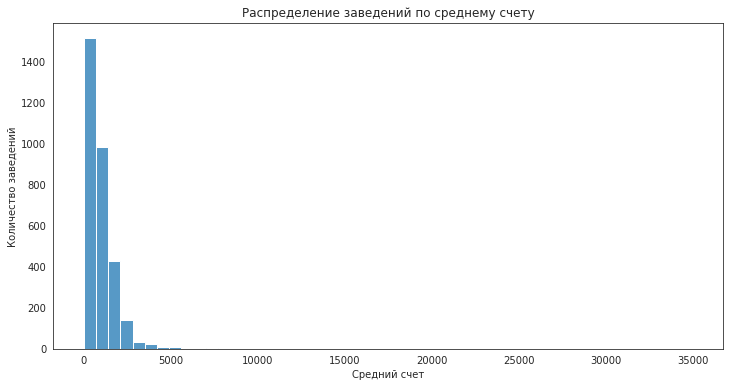

In [18]:
fig, ax = plt.subplots(figsize=(12,6))
ax.set_ylabel('Количество заведений')
ax.set_xlabel('Средний счет')
ax.set_title('Распределение заведений по среднему счету')
sns.histplot(df['middle_avg_bill'], bins=50)
plt.show()

Редко встречаются объекты со средним счетом более 5000.

Проверим на графике boxplot много ли выбросов.

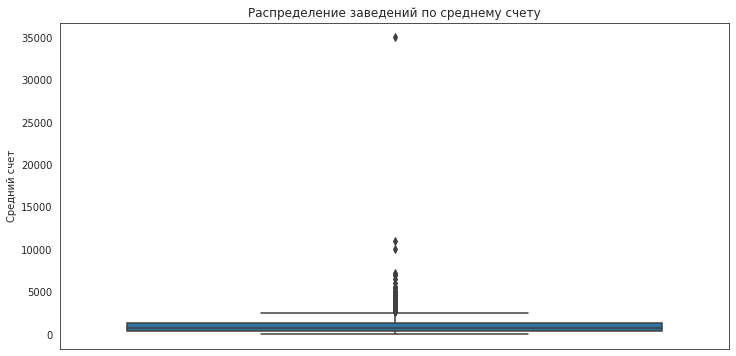

In [19]:
fig, ax = plt.subplots(figsize=(12,6))
sns.boxplot(data=df, y='middle_avg_bill')

ax.set_ylabel('Средний счет')
ax.set_title('Распределение заведений по среднему счету')
plt.show()

Есть выброс значения среднего чека свыше 35000 и редкие значения свыше 5000 руб.

Ограничим ось `y` значением 5000.

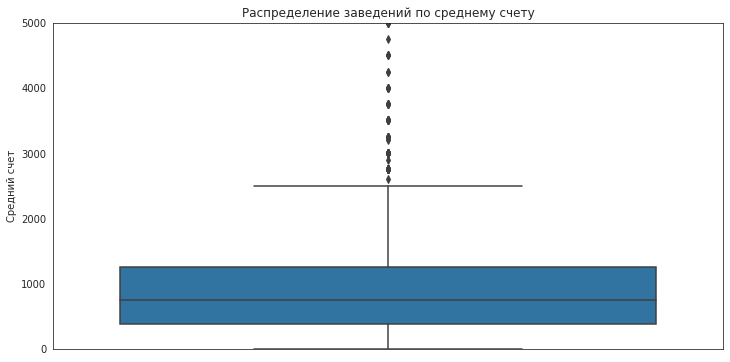

In [20]:
fig, ax = plt.subplots(figsize=(12,6))
sns.boxplot(data=df, y='middle_avg_bill')
ax.set_ylabel('Средний счет')
ax.set_title('Распределение заведений по среднему счету')
ax.set_ylim(0, 5000)
plt.show()

Есть нулевые значения среднего счета.

Последовательно проверим заведения, сначала с аномально большими средними счетами, затем с нулевыми.

Выводим информацию об объекте со средним чеком более 30000 рублей.

In [21]:
df[df['middle_avg_bill']>30000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
7177,Кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.65745,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100,Каширское шоссе,True


Уровень цен в этом заведении указан как высокий, но в значении среднего чека возможно ошибка, уменьшим его в 10 раз.

In [22]:
#для заведений, у которых средний счет больше 30000 уменьшаем его значение в 10 раз
df.loc[df['middle_avg_bill']>30000, 'middle_avg_bill'] = (
    df.loc[df['middle_avg_bill']>30000, 'middle_avg_bill'] / 10
)

Выведем список объектов со средним счетом более 5000 рублей.

In [23]:
print('Список заведений со средним чеком более 5000 рублей.')
display(df[df['middle_avg_bill']>5000])

Список заведений со средним чеком более 5000 рублей.


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
730,Чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49,Дмитровское шоссе,False
2795,Крошка Картошка,быстрое питание,"Москва, Щёлковское шоссе, вл75",Восточный административный округ,"ежедневно, 10:00–22:00",55.811160,37.799823,4.0,высокие,Средний счёт:1000–10000 ₽,5500.0,NaN,1,<NA>,Щёлковское шоссе,False
3038,Беллини,ресторан,"Москва, Рублёвское шоссе, 28",Западный административный округ,"ежедневно, 12:00–00:00",55.747632,37.425631,4.3,высокие,Средний счёт:5000–5500 ₽,5250.0,NaN,0,150,Рублёвское шоссе,False
3396,Марио,ресторан,"Москва, улица Климашкина, 17",Центральный административный округ,"ежедневно, 12:00–00:00",55.767792,37.568453,4.5,высокие,Средний счёт:7000 ₽,7000.0,NaN,0,100,улица Климашкина,False
3487,800°с Contemporary Steak,ресторан,"Москва, Большой Патриарший переулок, 6, стр. 1",Центральный административный округ,"ежедневно, 09:00–23:30",55.762708,37.592138,4.7,высокие,Средний счёт:6000–8000 ₽,7000.0,NaN,0,75,Большой Патриарший переулок,False
3518,Чайка,ресторан,"Москва, Краснопресненская набережная, 12А",Центральный административный округ,"ежедневно, 12:00–00:00",55.752857,37.556365,4.8,высокие,Средний счёт:5000–8000 ₽,6500.0,NaN,1,250,Краснопресненская набережная,False
3603,Lucky Izakaya Bar,"бар,паб","Москва, Калашный переулок, 9",Центральный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00–00:00",55.757313,37.599581,4.8,высокие,Средний счёт:5500 ₽,5500.0,NaN,0,<NA>,Калашный переулок,False
3882,White Rabbit,ресторан,"Москва, Смоленская площадь, 3",Центральный административный округ,"ежедневно, 12:00–00:00",55.747608,37.581248,4.9,высокие,Средний счёт:7000–7500 ₽,7250.0,NaN,0,150,Смоленская площадь,False
3910,Кантинетта Антинори,ресторан,"Москва, Денежный переулок, 20",Центральный административный округ,"ежедневно, 12:00–00:00",55.745383,37.586595,4.7,высокие,Средний счёт:6000 ₽,6000.0,NaN,0,80,Денежный переулок,False
5481,Гости,ресторан,"Москва, шоссе Энтузиастов, 52",Восточный административный округ,"пн,вс 18:00–22:30",55.759088,37.760570,4.1,высокие,Средний счёт:5000–15000 ₽,10000.0,NaN,0,<NA>,шоссе Энтузиастов,False


В этом списке странно выглядит "Крошка Картошка".  Посмотрим медианное значение среднего чека в этой сети заведений.

In [24]:
print(f'''Медиана среднего чека в сети Крошка Картошка: {df[df['name']=="Крошка Картошка"]['middle_avg_bill'].median()}''')

Медиана среднего чека в сети Крошка Картошка: 300.0


Заменим выбивающееся значение среднего чека в Крошке Картошке на медианное.

In [25]:
#для Крошки Картошки с выбивающимся значение среднего чека устанавливаем медианное значение для этой сети
df.loc[(df['middle_avg_bill']>5000) & (df['name']=='Крошка Картошка'), 'middle_avg_bill'] = (
    df[df['name']=="Крошка Картошка"]['middle_avg_bill'].median()
)

Теперь выведем информацию о заведениях со средним чеком менее 100 рублей.

In [26]:
print('Объекты общепита со средним чеком менее 100 рублей.')
display(df[df['middle_avg_bill']<100])

Объекты общепита со средним чеком менее 100 рублей.


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
1951,Пончики! Выпекаем на месте,кофейня,"Москва, улица Яблочкова, 19Г",Северо-Восточный административный округ,"ежедневно, 08:00–22:00",55.819120,37.578073,4.6,NaN,Средний счёт:от 50 ₽,50.0,NaN,1,250,улица Яблочкова,False
2316,Монастырская чайная,кафе,"Москва, 2-й Красносельский переулок, 5с3",Центральный административный округ,"ежедневно, 09:00–21:00",55.783773,37.666269,4.1,NaN,Средний счёт:35–100 ₽,67.0,NaN,0,<NA>,2-й Красносельский переулок,False
3688,Кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,высокие,Средний счёт:от 0 ₽,0.0,NaN,1,200,улица Новый Арбат,True
5420,Пончики! Выпекаем на месте,булочная,"Москва, Новокосинская улица, 35",Восточный административный округ,"ежедневно, 08:00–22:00",55.743570,37.866127,4.3,NaN,Средний счёт:от 50 ₽,50.0,NaN,1,4,Новокосинская улица,False
6428,Бургер Mix,быстрое питание,"Москва, улица Гурьянова, 2А",Юго-Восточный административный округ,"ежедневно, 10:00–21:00",55.693587,37.722745,4.1,низкие,Средний счёт:90 ₽,90.0,NaN,0,40,улица Гурьянова,False
6543,Пончики! Выпекаем на месте,кофейня,"Москва, проспект Вернадского, 109",Западный административный округ,пн-сб 08:00–22:00; вс 09:00–22:00,55.662333,37.483580,4.7,NaN,Средний счёт:от 50 ₽,50.0,NaN,1,5,проспект Вернадского,False
7297,Пончики! Выпекаем на месте,кофейня,"Москва, Люблинская улица, 163/1",Юго-Восточный административный округ,"ежедневно, 08:00–22:00",55.651354,37.744222,4.7,NaN,Средний счёт:50 ₽,50.0,NaN,1,93,Люблинская улица,False
7545,Шаурмян у Арена,быстрое питание,"Москва, Краснодарская улица, 47",Юго-Восточный административный округ,"ежедневно, 09:00–23:00",55.677744,37.764810,3.3,NaN,Средний счёт:от 30 ₽,30.0,NaN,0,2,Краснодарская улица,False


Для Кофемании, у которой установлено нулевое значение среднего чека, заменим его на медианное значение для данной сети.

In [27]:
print(f'''Медианное значение среднего чека в сети Кофемания: {df.loc[df['name']=='Кофемания', 'middle_avg_bill'].median()}''')

Медианное значение среднего чека в сети Кофемания: 2000.0


In [28]:
#заменяем нулевое значение среднего чека в Кофемании на медианное
df.loc[(df['middle_avg_bill']==0) & (df['name']=='Кофемания'), 'middle_avg_bill'] = (
   df.loc[df['name']=='Кофемания', 'middle_avg_bill'].median() 
)

Убрали аномальные значения в средних чеках, переходим к проверке средей цены чашки кофе.

**Столбец `middle_coffee_cup`**

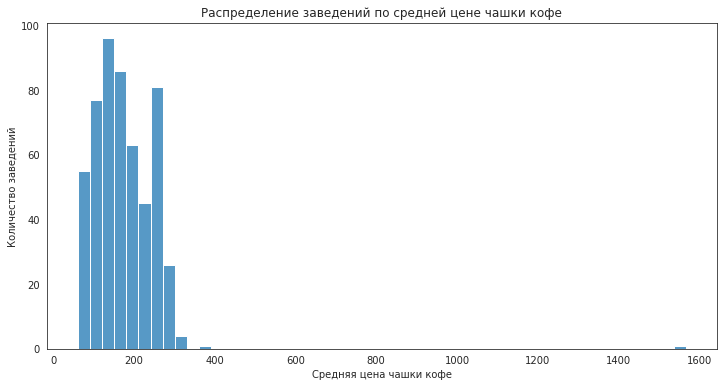

In [29]:
fig, ax = plt.subplots(figsize=(12,6))
ax.set_ylabel('Количество заведений')
ax.set_xlabel('Средняя цена чашки кофе')
ax.set_title('Распределение заведений по средней цене чашки кофе')
sns.histplot(df['middle_coffee_cup'], bins=50)
plt.show()

Есть выброс, чашка кофе по цене более 1500 рублей.

Ограничим цену диапазоном от 0 до 400 рублей и построим boxplot.

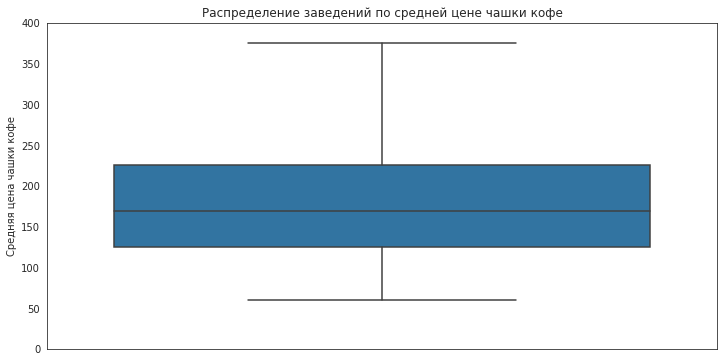

In [30]:
fig, ax = plt.subplots(figsize=(12,6))
sns.boxplot(data=df, y='middle_coffee_cup')
ax.set_ylabel('Средняя цена чашки кофе')
ax.set_title('Распределение заведений по средней цене чашки кофе')
ax.set_ylim(0, 400)
plt.show()

Выведем информацию об объекте с аномальным значением средней цены чашки кофе.

In [31]:
#заведения со средней ценой чашки кофе более 500 рублей
display(df[df['middle_coffee_cup']>500])

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48,Большая Семёновская улица,False


Чашка кофе за 1568 рублей в кофейне Шоколадница!  Видимо произошла ошибка при вводе верхней границы цены.

Исправим значение `middle_coffee_cup` для этого заведения на медианное значение, которое рассчитаем среди кофеен данной сети.

In [32]:
print(f'''Медианная цена чашки кофе в сети Шоколадница: 
    {df[df['name']=='Шоколадница']['middle_coffee_cup'].median()}
''')

Медианная цена чашки кофе в сети Шоколадница: 
    256.0



In [33]:
df.loc[df['middle_coffee_cup']>500, 'middle_coffee_cup'] =(
df[df['name']=='Шоколадница']['middle_coffee_cup'].median()
)  

**Итак, на этапе предобработки данных:**

- преобразовали тип данных в столбце `seats`, заменили float на int;
- определили долю пропусков в столбцах;
- проверили датасет на наличие дубликатов;
- добавили столбцы `street` - с названиями улиц, и `is_24/7` - с признаком круглосуточной работы;
- исправили аномальные значения в столбцах  `middle_avg_bill` и `middle_coffee_cup`.

Переходим к анализу данных.

<a id="data_analysis"></a>

## Анализ данных

<a id="category"></a>

### Категории заведений

Посмотрим, какие категории заведений представлены в наших данных:

In [34]:
print(df.category.unique())

['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


Посчитаем количество заведений:

In [35]:
dc = (df.groupby('category', as_index=False)
      .agg({'category' : ['first','count']})
     )
dc.columns = ['category', 'count']
dc = dc.sort_values(by='count', ascending=False)

In [36]:
print(f"Всего заведений в городе: {len(df)}")
print(f"\nРаспределение по категориям:")
display(dc)

Всего заведений в городе: 8406

Распределение по категориям:


,category,count
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


Построим графики в разрезе категории заведения.

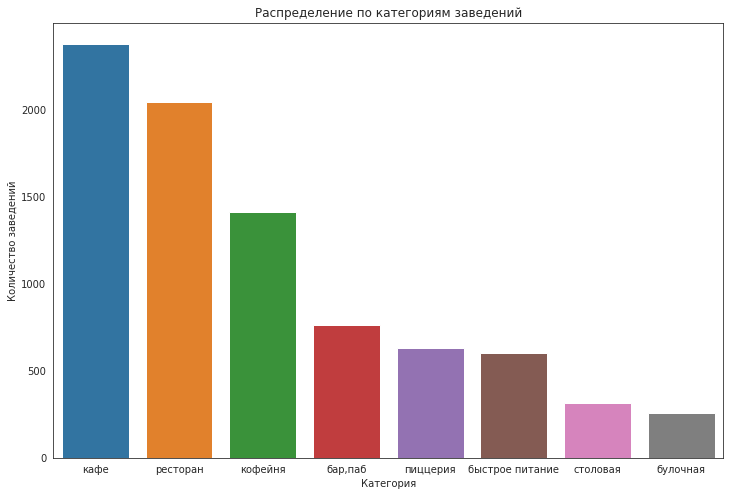

In [37]:
fig, ax = plt.subplots(figsize=(12,8))
ax = sns.barplot(data=dc, x='category', y='count')
ax.set_ylabel('Количество заведений')
ax.set_xlabel('Категория')
ax.set_title('Распределение по категориям заведений');

Кафе занимают первое место по количеству, следом идут рестораны и кофейни.
Меньше всего в Москве булочных и столовых.

In [38]:
#строим круговую диаграмму
fig = go.Figure(go.Pie(labels=dc['category'],
                       values=dc['count'],
                       pull = [0.05, 0]
                      )
               )
fig.update_layout(title='Распределение заведений по категориям',
                  width = 800,
                  height = 600)
fig.update_traces(hole=0.4)

fig.show()

Кафе и рестораны занимают примерно по четверти от общего количества.

<a id="seats"></a>

### Количество посадочных мест

Создадим отдельный датафрейм, в который включим только те заведения, для которых заполнена информация о количестве посадочных мест.

In [39]:
#оставляем только строки с заполненным значением количества посадочных мест
df_seats = df[~df['seats'].isna()]

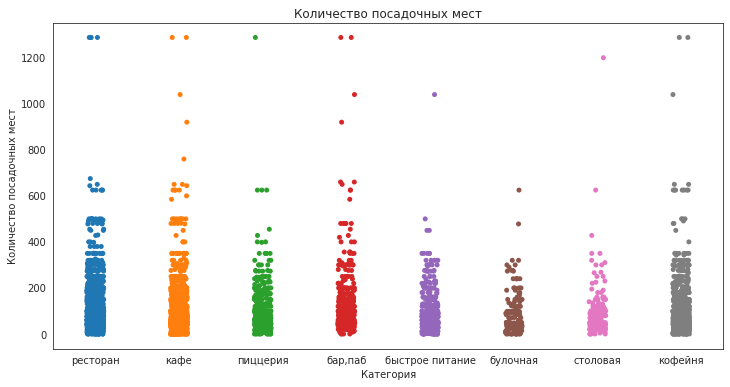

In [40]:
fig, ax = plt.subplots(figsize=(12,6))
sns.stripplot(x='category', y='seats', data=df_seats)
ax.set_title('Количество посадочных мест')
ax.set_xlabel('Категория')
ax.set_ylabel('Количество посадочных мест')
plt.show()

Более 800 посадочных мест можно увидеть крайне редко. Такие большие значения выглядят подозрительно, так как встречаются одинаковые значения для разных категорий. 

Выведем заведения общепита, для которых указано более 800 посадочных мест.

In [41]:
display(df[df['seats']>800][['name','category','address','seats']])

,name,category,address,seats
2713,Ваня и Гоги,"бар,паб","Москва, Измайловское шоссе, 71, корп. А",1040
2722,Маргарита,быстрое питание,"Москва, Измайловское шоссе, 71, корп. А",1040
2770,Шоколадница,кофейня,"Москва, Измайловское шоссе, 71, корп. А",1040
2966,Матрешка,кафе,"Москва, Измайловское шоссе, 71, корп. А",1040
4180,Eataly,"бар,паб","Москва, Киевская улица, 2",920
4231,РестоБар Argomento,столовая,"Москва, Кутузовский проспект, 41, стр. 1",1200
4245,Стейк & Бургер,кафе,"Москва, Киевская улица, 2",920
6518,DelonixCafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",1288
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",1288
6574,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",1288


Можно предположить, что в каких-то случаях количество посадочных мест указывали для всего комплекса или фудкорта, в котором расположено несколько заведений, а в каких-то случаях количесто мест завышено. 

Посмотрим на распределение, ограничив диапазон посадочных мест значениями от 0 до 350.

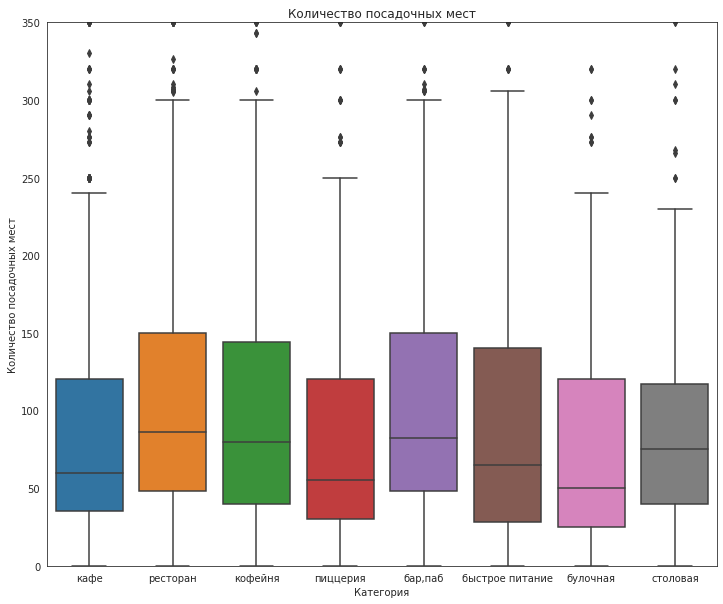

In [42]:
fig, ax = plt.subplots(figsize=(12,10))
sns.boxplot(x='category', y='seats', data=df)
ax.set_title('Количество посадочных мест')
ax.set_xlabel('Категория')
ax.set_ylabel('Количество посадочных мест')
plt.ylim(0,350)
plt.show()

In [43]:
df_seats_grouped= df_seats.groupby('category', as_index=False).agg({'seats' : 'median'}).sort_values(by='seats', ascending=False).reset_index(drop=True)
display(df_seats_grouped)

,category,seats
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


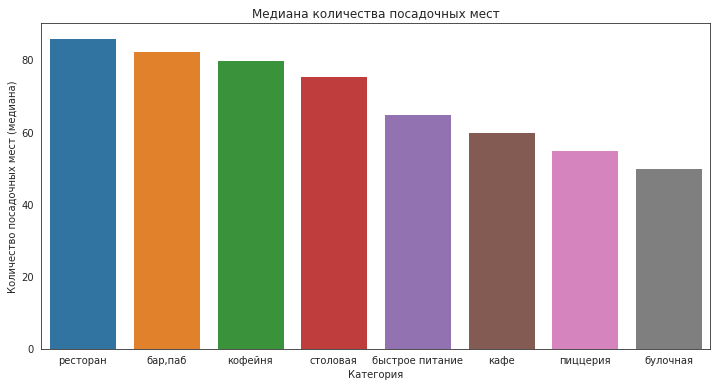

In [44]:
fig, ax = plt.subplots(figsize=(12,6))
sns.barplot(data=df_seats_grouped, y='seats', x='category')
ax.set_title('Медиана количества посадочных мест')
ax.set_xlabel('Категория')
ax.set_ylabel('Количество посадочных мест (медиана)')
plt.show()

Медианное значение количества посадочных мест находится в диапазоне от 50 - для булочных, до 86 - для ресторанов.

<a id="chain_restaurant"></a>

### Сетевые и несетевые заведения

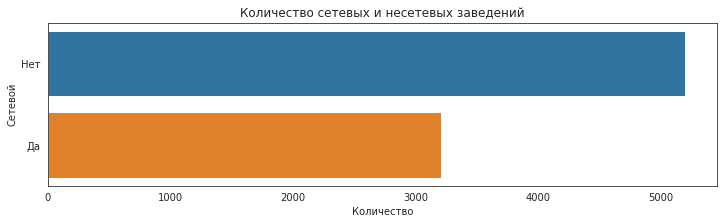

In [45]:
fig, ax = plt.subplots(figsize=(12,3))
sns.countplot(data=df, y='chain')
ax.set_title('Количество сетевых и несетевых заведений')
ax.set_xlabel('Количество')
ax.set_ylabel('Сетевой')
ax.set_yticklabels(['Нет','Да'])
plt.show()

In [46]:
df_chain_grouped = (df.groupby('chain', as_index=False).agg({'chain' : 'count'})
                    .rename(columns={'chain' : 'counts'})
)
df_chain_grouped.index = ['Несетевой', 'Сетевой']
display(df_chain_grouped)

,counts
Несетевой,5201
Сетевой,3205


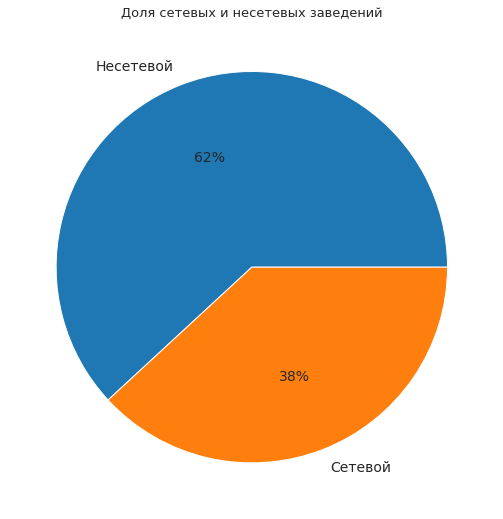

In [47]:
fig, ax = plt.subplots(figsize=(9,9))
df_chain_grouped['counts'].plot(kind='pie', autopct='%1.0f%%', legend=False, fontsize = 14)
ax.set_title('Доля сетевых и несетевых заведений', fontsize = 13)
ax.set(xlabel='', ylabel='')
plt.show()

Несетевых заведений больше, чем сетевых.

Посмотрим, какие категории заведений чаще являются сетевыми:

In [48]:
#считаем долю сетевых заведений в каждой из категорий
display(df.groupby('category').agg({'chain' : 'mean'})
                       .sort_values(by='chain', ascending=False)
                       .style.background_gradient('coolwarm')
                       .format('{:.1%}')
)

,chain
category,
булочная,61.3%
пиццерия,52.1%
кофейня,51.0%
быстрое питание,38.5%
ресторан,35.7%
кафе,32.8%
столовая,27.9%
"бар,паб",22.1%


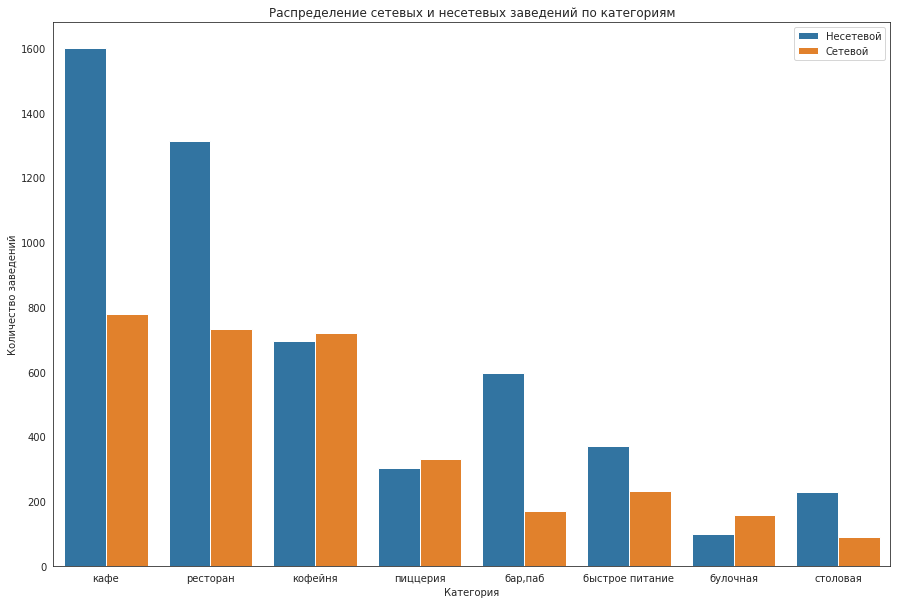

In [49]:
fig, ax = plt.subplots(figsize=(15,10))
sns.countplot(data=df, x='category', hue='chain')
ax.set_title('Распределение сетевых и несетевых заведений по категориям')
ax.set_xlabel('Категория')
ax.set_ylabel('Количество заведений')
plt.legend(loc='upper right', labels=['Несетевой', 'Сетевой'])
plt.show()

Более 60% булочных является сетевыми, и это наибольшая доля среди всех категорий. Также большое распространение сетевые заведения получили в категориях "пиццерия" и "кофейня", в которых сетевые и несетевые заведения делятся примерно поровну.

Наименьшая доля сетевых заведений среди баров/пабов и столовых.

Среди лидеров по общему количеству заведений, кафе и ресторанов, доля сетевых занимает около трети.

<a id="top_15"></a>

### Топ-15 популярных сетей в Москве

Найдём топ-15 популярных сетей. Уровень популярности будем измерять по количеству заведений сети в регионе. 

In [50]:
#выбираем топ-15 сетей по количеству заведений в сети
df_top15 = (df[df['chain']==1].groupby('name', as_index=False)
            .agg({'chain' : 'count', 'category' : 'first'})
            .sort_values(by='chain', ascending=False)
            .reset_index(drop=True)
            .head(15)
)

In [51]:
display(df_top15)

,name,chain,category
0,Шоколадница,120,кофейня
1,Домино'с Пицца,76,пиццерия
2,Додо Пицца,74,пиццерия
3,One Price Coffee,71,кофейня
4,Яндекс Лавка,69,ресторан
5,Cofix,65,кофейня
6,Prime,50,ресторан
7,Хинкальная,44,быстрое питание
8,КОФЕПОРТ,42,кофейня
9,Кулинарная лавка братьев Караваевых,39,кафе


Построим столбчатый график для топ-15 сетей.

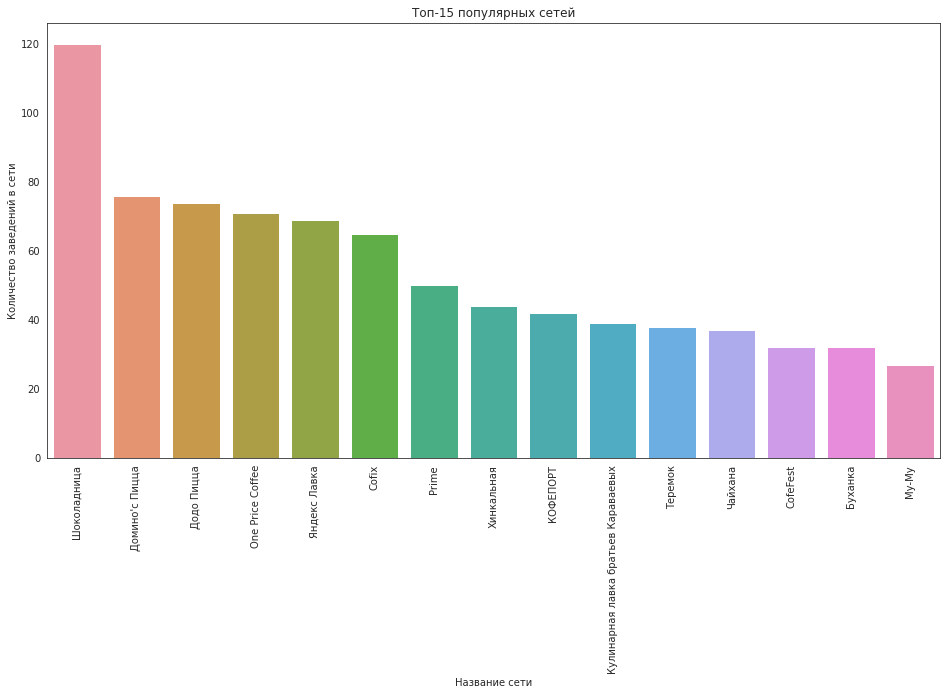

In [52]:
#строим столбчатый график
fig, ax = plt.subplots(figsize=(16,8))
sns.barplot(data=df_top15, x='name', y='chain')
plt.xticks(rotation=90)
ax.set_title('Топ-15 популярных сетей')
ax.set_xlabel('Название сети')
ax.set_ylabel('Количество заведений в сети')
plt.show()

Сравним распределение рейтинга для заведений, которые:
1. входят в ТОП-15 сетевых
2. не входят в ТОП-15 сетевых
3. не являются сетевыми

In [53]:
#выделяем группы: топ15, вне топ15 и несетевые
chain_top15 = df[(df['name'].isin(df_top15['name'])) & (df['chain']==1)]
chain_out_top15 = df[(~df['name'].isin(df_top15['name'])) & (df['chain']==1)]
not_chain = df[df['chain']==0]

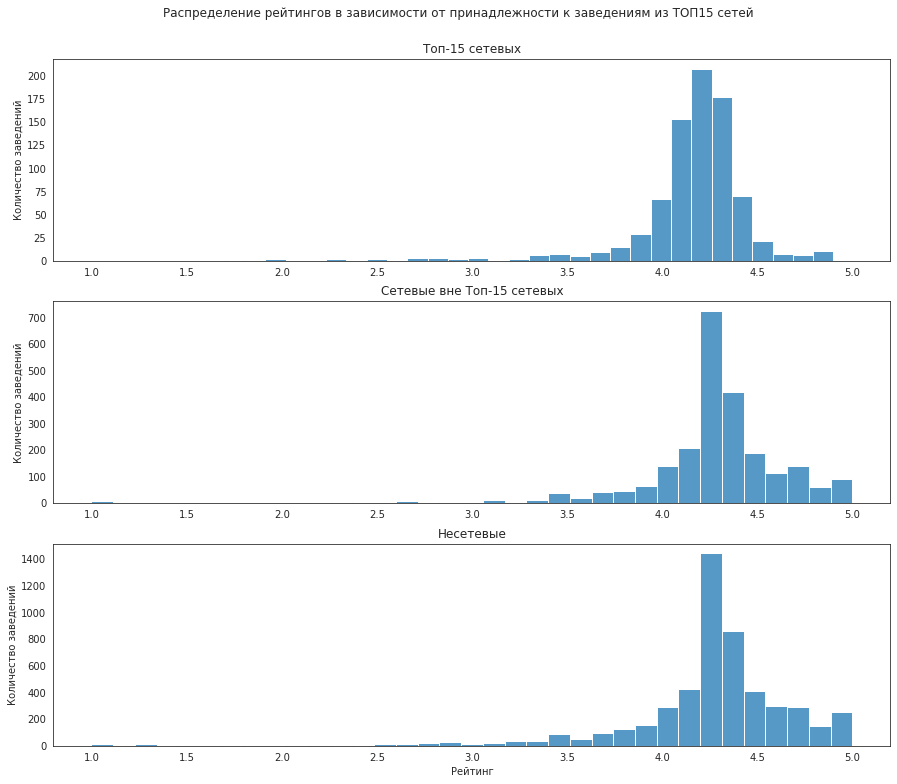

In [54]:
#строим распределение рейтинов в зависимости от принадлежности к топ15 сетевых
plt.figure(figsize=(15, 12))
plt.subplots_adjust(top=0.92) # adjust the Figure in rp
plt.suptitle('Распределение рейтингов в зависимости от принадлежности к заведениям из ТОП15 сетей')


ax1 = plt.subplot(3,1,1)
sns.histplot(chain_top15['rating'], bins=30, ax=ax1)

plt.title('Топ-15 сетевых')
plt.xlabel('')
plt.ylabel('Количество заведений')
ax2 = plt.subplot(3,1,2, sharex=ax1)
sns.histplot(chain_out_top15['rating'], bins=35, ax=ax2)
plt.title('Сетевые вне Топ-15 сетевых')
plt.xlabel('')
plt.ylabel('Количество заведений')
ax3 = plt.subplot(3,1,3, sharex=ax1)
sns.histplot(not_chain['rating'], bins=35, ax=ax3)
plt.title('Несетевые')
plt.xlabel('Рейтинг')
plt.ylabel('Количество заведений')

plt.show()

У сетевых заведений из ТОП15 поменьше максимальных оценок. Посмотрим на то же распределение на другом виде графика.

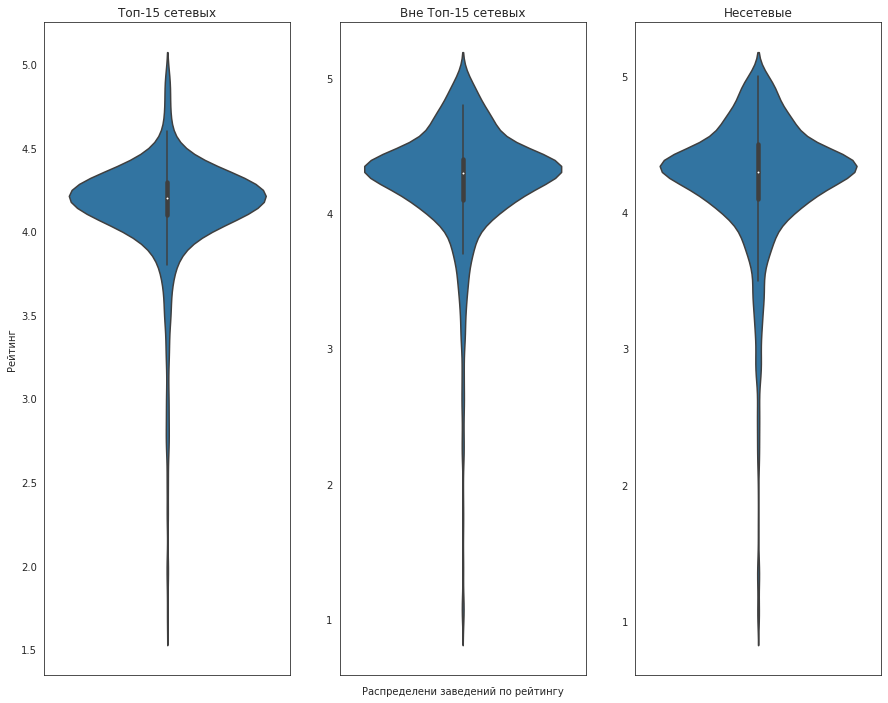

In [55]:
#строим распределение рейтинов в зависимости от принадлежности к топ15 сетевых (violinplot)
plt.figure(figsize=(15, 12))

ax1 = plt.subplot(1,3,1)
sns.violinplot(data=chain_top15, y='rating', ax=ax1)
plt.title('Топ-15 сетевых')
plt.xlabel('')
plt.ylabel('Рейтинг')
ax2 = plt.subplot(1,3,2, sharex=ax1)
sns.violinplot(data=chain_out_top15, y='rating', ax=ax2)
plt.title('Вне Топ-15 сетевых')
plt.xlabel('Распределени заведений по рейтингу')
plt.ylabel('')
ax3 = plt.subplot(1,3,3, sharex=ax1)
sns.violinplot(data=not_chain, y='rating', ax=ax3)
plt.title('Несетевые')
plt.xlabel('')
plt.ylabel('')

plt.show()

Можно отметить, что у заведений из ТОП-15 сетей, распределение оценок выглядит чуть хуже. Медиана рейтинга ниже, чем у объектов общепита не входящих в сети из ТОП-15 и чем у несетевых заведений. 

Проверим, есть ли отличия в уровне цен между сетевыми заведениями из ТОП-15, по сравнению с сетевыми заведениями не из ТОП-15 и несетевыми объектами общепита. 

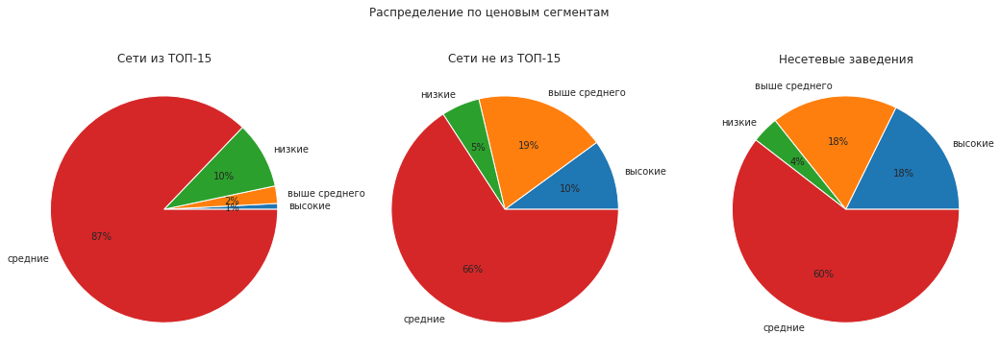

In [56]:
fig, axs = plt.subplots(1,3, figsize=(18,8))

level_price = chain_top15.groupby('price').agg(count=('name',  'count'))['count']
labels = chain_top15.groupby('price').agg(count=('name',  'count')).index

ax1 = plt.subplot(1,3,1)
ax1.pie(level_price, labels = labels, autopct='%1.0f%%')
ax1.set_title("Сети из ТОП-15")

level_price = chain_out_top15.groupby('price').agg(count=('name',  'count'))['count']
labels = chain_out_top15.groupby('price').agg(count=('name',  'count')).index

ax2 = plt.subplot(1,3,2)
ax2.pie(level_price, labels = labels, autopct='%1.0f%%')
ax2.set_title("Сети не из ТОП-15")

level_price = not_chain.groupby('price').agg(count=('name',  'count'))['count']
labels = not_chain.groupby('price').agg(count=('name',  'count')).index

ax3 = plt.subplot(1,3,3)
ax3.pie(level_price, labels = labels, autopct='%1.0f%%')

ax3.set_title("Несетевые заведения")

fig.subplots_adjust(top=1.1) # adjust the Figure in rp
fig.suptitle('Распределение по ценовым сегментам')

plt.show()

`97%` заведений из ТОП-15 сетей относятся к среднему и низкому ценовому сегментам. В сетях не входящих в ТОП-15 к среднему и нижнему ценовым сегментам относятся `71%` заведений, а среди несетевых объектов - `64%`.

Выясним, какие категории чаще встречаются среди ТОП15 сетевых. 

In [57]:
df_cat_top15 = (df_top15.
                groupby('category', as_index=False)
                .agg({'name' : 'count', 'chain' : 'sum'})
                .rename(columns={'name' : 'num_of_chains', 'chain' : 'num_of_instit'})
                .sort_values(by='num_of_chains', ascending=False)
               )

In [58]:
display(df_cat_top15)

,category,num_of_chains,num_of_instit
3,кофейня,5,330
2,кафе,3,103
5,ресторан,3,157
4,пиццерия,2,150
0,булочная,1,32
1,быстрое питание,1,44


Пять сетей из ТОП-15 относятся к категории `Кофейни`.  Отобразим на круговых диаграммах долю категорий, входящих в ТОП-15 сетей, и долю количества объектов из этих категорий. 

In [59]:
# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=df_cat_top15['category'],
                       values=df_cat_top15['num_of_chains'],
                       pull = [0.05, 0],
                       name='Сети'),
              1, 1)

fig.add_trace(go.Pie(labels=df_cat_top15['category'],
                       values=df_cat_top15['num_of_instit'],
                       pull = [0.05, 0],
                       name='Заведения'),
              1, 2)


# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4)

fig.update_layout(
    title_text="Распределение ТОП-15 сетей по категориям",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Сети', x=0.18, y=0.5, font_size=20, showarrow=False),
                 dict(text='Заведения', x=0.87, y=0.5, font_size=17, showarrow=False)],
                 width = 800,
                 height = 600)
fig.show()

Среди топ-15 сетей, наибольшее количество - 5 штук, относится к кофейням, затем следуют кафе и рестораны, у которых по 3 представителя.

Если смотреть по количеству заведений, входящих в топ-15 сетей, то доля кофеен составляет около 40%, а затем идут рестораны и пиццерии с 18%-19%.

In [60]:
print('Доля заведений, работающих круглосуточно:')
print(f"Сетевых из ТОП-15   : {chain_top15['is_24/7'].mean():.2%}")
print(f"Сетевых не из ТОП-15: {chain_out_top15['is_24/7'].mean():.2%}")
print(f"Несетевых           : {not_chain['is_24/7'].mean():.2%}")

Доля заведений, работающих круглосуточно:
Сетевых из ТОП-15   : 5.15%
Сетевых не из ТОП-15: 11.34%
Несетевых           : 8.02%


Заведения, входящие в сети из ТОП-15, реже работают круглосуточно.

<a id="districts"></a>

### Административные районы Москвы

In [61]:
print(f"Количество административных округов: {len(df['district'].unique())}\n")
print('Количество заведений общепита в административном округе:')
display(df['district'].value_counts())

Количество административных округов: 9

Количество заведений общепита в административном округе:


Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

Для удобства добавим столбец с аббревиатурами округов, чтобы пользоваться ими при выводе информации на графиках.

In [62]:
#добавляем столбец с сокращенными названиями округов
#выбираем первые буквы каждого слова и переводим в верхний регистр
df['district_abb'] = df.apply(lambda x: str.upper(re.sub(r'(\w)\w*\W?', r'\1', x['district'])), axis=1)

In [63]:
print("Список округов:", df['district_abb'].unique())

Список округов: ['САО' 'СВАО' 'СЗАО' 'ЗАО' 'ЦАО' 'ВАО' 'ЮВАО' 'ЮАО' 'ЮЗАО']


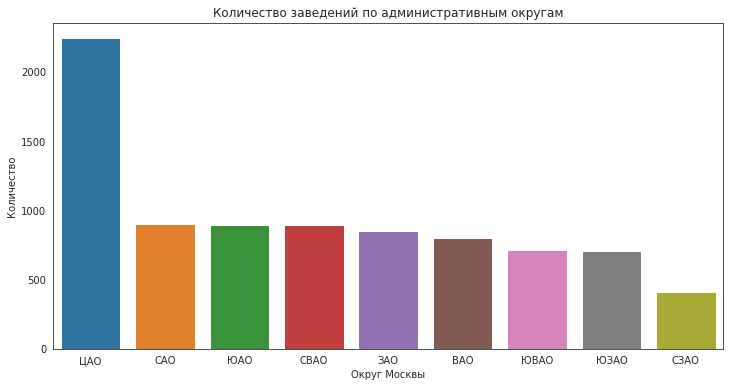

In [64]:
fig, ax = plt.subplots(figsize=(12,6))
sns.countplot(x='district_abb', data=df,
             order=df['district_abb'].value_counts().index)
ax.set_title('Количество заведений по административным округам')
ax.set_ylabel('Количество')
ax.set_xlabel('Округ Москвы')
plt.show()

Наибольшее количество заведений сосредоточено в ЦАО. Наименьшее - в СЗАО.

Рассмотрим распределение заведений по категориям в каждом из административных округов.

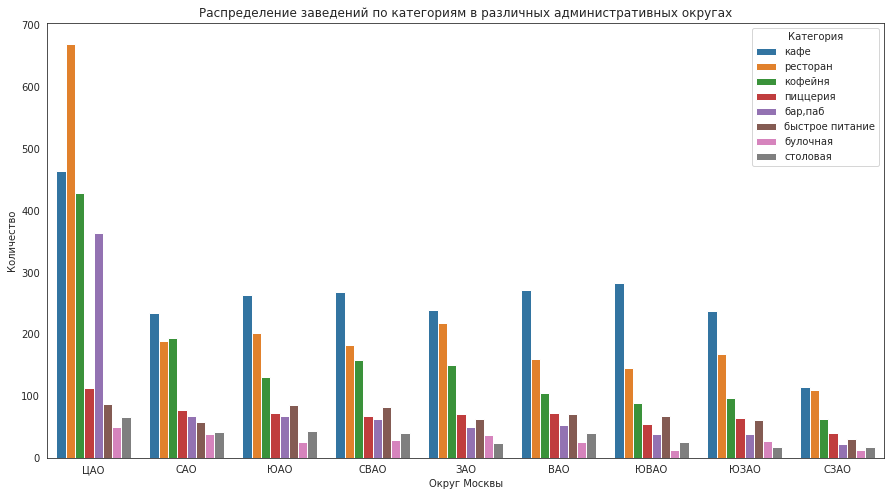

In [65]:
fig, ax = plt.subplots(figsize=(15,8))
sns.countplot(x='district_abb', hue='category', data=df,
             order=df['district_abb'].value_counts().index)
ax.set_title('Распределение заведений по категориям в различных административных округах')
ax.set_ylabel('Количество')
ax.set_xlabel('Округ Москвы')
plt.legend(loc='upper right', title='Категория')
plt.show()

В ЦАО `рестораны` лидируют по количеству объектов. Во всех остальных округах `рестораны` идут на втором месте, уступая `кафе`. На третьем месте по популярности практически во всех округах идут `кофейни`, и только в САО `кофейни` вырвались на второе место.

Можно отметить большое количество `баров/пабов` в ЦАО, и их большую долю в сравнении с другими районами города.

Посмотрим на распределение по округам в разрезе каждой категории.

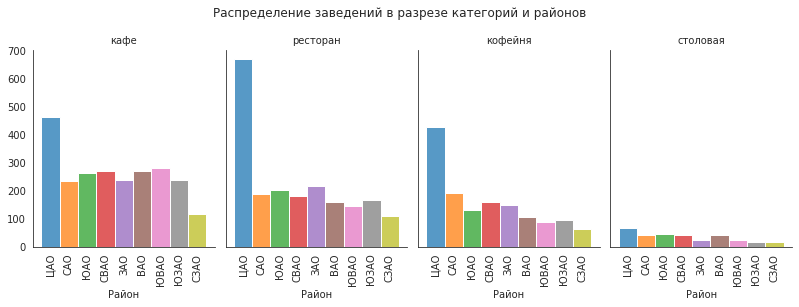

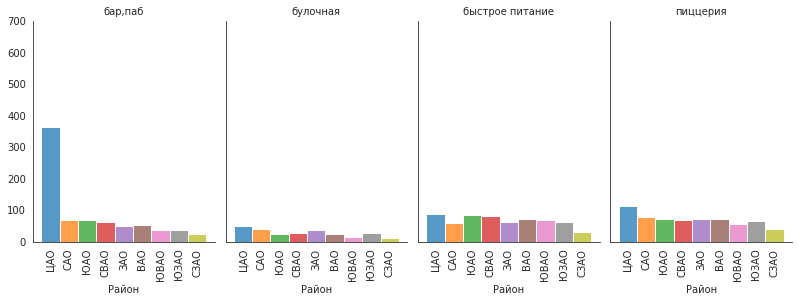

In [66]:
g = sns.FacetGrid(df.query('category in ("ресторан", "кафе", "кофейня", "столовая")')
                  .sort_values(by='district_abb'),
                  col='category', col_wrap=4, height=4,
                  aspect=0.7, hue='district_abb', hue_order=df['district_abb'].value_counts().index)

g.fig.subplots_adjust(top=0.9) # adjust the Figure in rp
g.fig.suptitle('Распределение заведений в разрезе категорий и районов')

g.map(sns.histplot, 'district_abb')
g.set_xlabels(label="Район", clear_inner=False)
g.set_xticklabels(rotation=90)
g.set_titles(col_template='{col_name}')


g = sns.FacetGrid(df.query('category in ("пиццерия", "бар,паб", "булочная", "быстрое питание")')
                  .sort_values(by='district_abb'),
                  col='category', col_wrap=4, height=4, ylim=(0, 700),
                  aspect=0.7, hue='district_abb', hue_order=df['district_abb'].value_counts().index)

g.map(sns.histplot, 'district_abb')
g.set_xlabels(label="Район", clear_inner=False)
g.set_xticklabels(rotation=90)
g.set_titles(col_template='{col_name}')


plt.show()

К какой бы категории ни относился объект общепита, наибольшее их количество находится в ЦАО.

In [67]:
df_districts = (df.groupby(['district_abb', 'category'], as_index=False)
     .agg(count=('name', 'count'))
)
df_districts['sum'] = df_districts.groupby('district_abb')['count'].transform(sum)
df_districts['cat_proportion'] = round(df_districts['count'] / df_districts['sum'], 4)
df_districts=df_districts.sort_values(by=['sum', 'category'], ascending=[False, True])

In [68]:
fig=px.bar(df_districts, 
           y='cat_proportion',
           x='district_abb',
           color='category',
           title='Распределениe заведений по категориям в различных округах',
           text=round(df_districts['cat_proportion']*100, 1)
          )
           
fig.update_layout(
    legend_title='Категории заведений',
    yaxis_title='Процент заведений в районе',
    xaxis_title='Район Москвы',
    width=800,
    height=700
)

fig.show()

Если внутри конкретного округа определять долю заведений, относящихся к определённой категории, то наибольшая доля заведений из категорий находится:
- `рестораны` в ЦАО с долей 30%,
- `кафе` в ЮВАО - 40%,
- `бары/пабы` в ЦАО - 16%,
- `кофейни` в САО - 21%,
- `столовые` в ВАО - 5%,
- `булочные` в ЗАО - 4.4%,
- `быстрое питание` в ЮАО - 9.5%,
- `пиццерии` в СЗАО - 9.8%,


<a id="rating"></a>

### Средние рейтинги по категориям заведений

Посчитаем средние и медианные рейтинги в разрезе категории заведений.

In [69]:
df_rating = (df.groupby('category', as_index=False)
    .agg(rating_median=('rating', 'median'), rating_mean=('rating', 'mean'))
    .sort_values(by=['rating_median', 'rating_mean'], ascending=[False, False])
)
display(df_rating) 

,category,rating_median,rating_mean
0,"бар,паб",4.4,4.387712
5,пиццерия,4.3,4.301264
6,ресторан,4.3,4.290357
4,кофейня,4.3,4.277282
1,булочная,4.3,4.268359
7,столовая,4.3,4.211429
3,кафе,4.2,4.123886
2,быстрое питание,4.2,4.050249


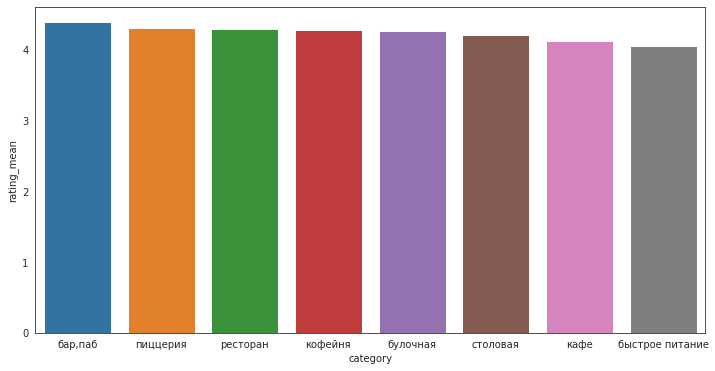

In [70]:
fig, ax = plt.subplots(figsize=(12,6))
sns.barplot(data=df_rating, y='rating_mean', x='category')
plt.show()

Лучший средний рейтинг у категории `бар.паб`, худший - `быстрое питание`.

Взглянем на распределение рейтингов по категориям заведений.

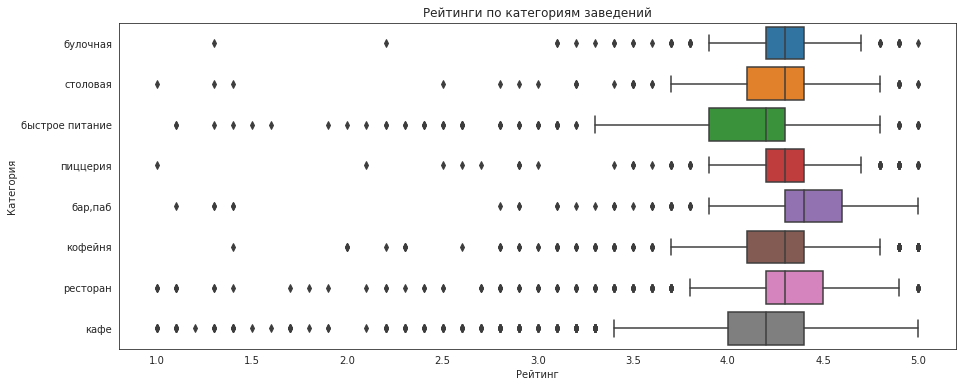

In [71]:
#распределение рейтингов по категориям заведений.
fig, ax = plt.subplots(figsize=(15,6))
sns.boxplot(data=df, x='rating', y='category',  order=df['category'].value_counts(ascending=True).index)
ax.set_title('Рейтинги по категориям заведений')
ax.set_ylabel('Категория')
ax.set_xlabel('Рейтинг')

plt.show()

В каждой категории есть небольшое количество заведений с выбивающимися в худшую сторону рейтингами.

Посмотрим на ту же диаграмму, отбросив редкие оценки ниже 3 баллов.

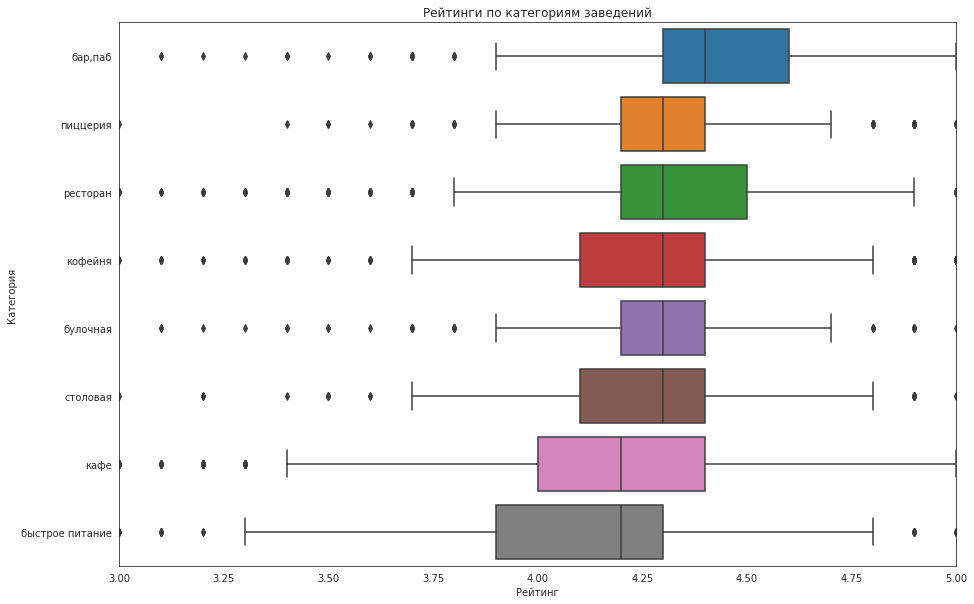

In [72]:
fig, ax = plt.subplots(figsize=(15,10))
sns.boxplot(data=df, x='rating', y='category',
            order=df.groupby('category')
            .agg(rating_median=('rating', 'median'), rating_mean=('rating', 'mean'))
            .sort_values(by=['rating_median', 'rating_mean'], ascending=[False, False]).index)
ax.set_title('Рейтинги по категориям заведений')
ax.set_ylabel('Категория')
ax.set_xlabel('Рейтинг')
ax.set_xlim(3,5)

plt.show()

Для всех типов заведений средний рейтинг находится в диапазоне от 4 до 4,4 баллов, а медиана - от 4,2 до 4,4 балла. В лучшую сторону по значениям рейтинга выделяются `бары и пабы`, у которых медианный рейтинг составляет 4,4 балла, а чуть хуже других - `кафе` и `быстрое питание`, с медианным рейтингом 4,2 балла. Остальные типы заведений близки по средним оценкам посетителей.

<a id="rating_district"></a>

### Средние рейтинги по округам

**Построим фоновую картограмму со средним рейтингом заведений** в разрезе районов города.

In [73]:
#считаем средний рейтинг в разрезе районов
df_rating_district = df.groupby('district', as_index=False)['rating'].agg('mean')

In [74]:
print('\nСредний рейтинг заведений в округах Москвы.')
display(df_rating_district.sort_values(by='rating', ascending=False))


Средний рейтинг заведений в округах Москвы.


,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.239778
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181551
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.148260
6,Юго-Восточный административный округ,4.101120


In [75]:
#загружаем JSON-файл с границами округов Москвы
try:
    state_geo = (yandex_practicum_path + 'admin_level_geomap.geojson')
except:
    state_geo = (my_path + 'admin_level_geomap.geojson')

In [76]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

Заведения Центрального административного округа имеют наивысший средний рейтинг. Следом, на втором и третьем местах по среднему рейтингу, идут САО и СЗАО. Наименее рейтинговые заведения находятся в Юго-Восточном округе.

Отобразим все заведения на карте.

In [77]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# определяем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

<a id="top15_streets"></a>

### Улицы с наибольшим количеством заведений

Найдём топ-15 улиц с наибольшим количеством заведений.

In [78]:
top15_street = df['street'].value_counts().reset_index().head(15)
display(top15_street)

,index,street
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


Отобразим заведения этих улиц на карте Москвы.

In [79]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# определяем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df[df['street'].isin(top15_street['index'])].apply(create_clusters, axis=1)

# выводим карту
m

Посмотрим, через какие административные округа проходят улицы из ТОП-15.

In [80]:
print('Количество улиц из ТОП-15, проходящих через округ:')
display(
    (df[df['street'].isin(top15_street['index'])]
     .groupby(['district'], as_index=False)
     .agg(count=('street', 'nunique'))
    ).sort_values(by='count', ascending=False)
)

Количество улиц из ТОП-15, проходящих через округ:


,district,count
7,Юго-Западный административный округ,6
8,Южный административный округ,5
1,Западный административный округ,4
2,Северный административный округ,4
3,Северо-Восточный административный округ,3
5,Центральный административный округ,3
6,Юго-Восточный административный округ,2
0,Восточный административный округ,1
4,Северо-Западный административный округ,1


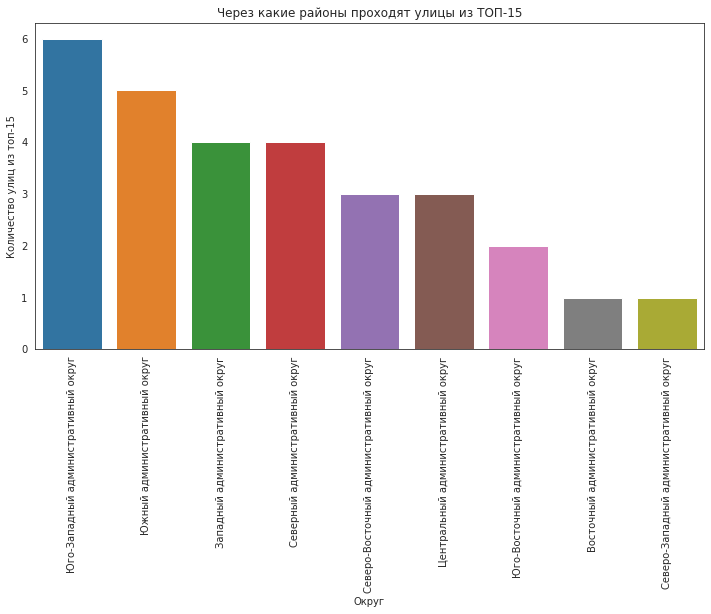

In [81]:
fig, ax = plt.subplots(figsize=(12,6))
sns.barplot(data=
    (df[df['street'].isin(top15_street['index'])]
     .groupby(['district'], as_index=False)
     .agg(count=('street', 'nunique'))
    ).sort_values(by='count', ascending=False)
, x='district', y='count')
ax.set_title('Через какие районы проходят улицы из ТОП-15')
ax.set_ylabel('Количество улиц из топ-15')
ax.set_xlabel('Округ')
plt.xticks(rotation=90)
plt.show()

Улицы из топ-15 по количеству заведений в основном проходят через Юго-Западный и Южный округ, а наименьшее их количество в Восточном и Северо-Западном округах.

Построим график распределения количества заведений и их категорий по улицам из ТОП-15.

Подготовим данные для графика:

In [82]:
#группируем данные по улице и категории
df_top15_streets = (df.groupby(['street', 'category'], as_index=False)
                    .agg(num_of_rest=('name', 'count'))
)

# добавляем столбец с общим количеством заведений на улице
df_top15_streets['total_rest_on_street'] = (df_top15_streets
                                            .groupby('street')['num_of_rest'].transform(sum))

#оставляем данные, относящиеся к улицам из списка ТОП-15
df_top15_streets = df_top15_streets[df_top15_streets['street'].isin(top15_street['index'])]

#добавляем столбец, в котором указываем долю категории заведений от общего количества заведений на улице
df_top15_streets['category_proportion'] = (round(df_top15_streets['num_of_rest'] /
                                           df_top15_streets['total_rest_on_street'], 4)
                                          )
#сортируем, чтобы на графиках сначала отображались улицы с наибольшим количеством заведений
df_top15_streets = df_top15_streets.sort_values(by=['total_rest_on_street', 'street'])

In [83]:
df_top15_streets

,street,category,num_of_rest,total_rest_on_street,category_proportion
2004,Пятницкая улица,"бар,паб",9,48,0.1875
2005,Пятницкая улица,булочная,3,48,0.0625
2006,Пятницкая улица,быстрое питание,2,48,0.0417
2007,Пятницкая улица,кафе,7,48,0.1458
2008,Пятницкая улица,кофейня,6,48,0.1250
...,...,...,...,...,...
2860,проспект Мира,кафе,53,184,0.2880
2861,проспект Мира,кофейня,36,184,0.1957
2862,проспект Мира,пиццерия,11,184,0.0598
2863,проспект Мира,ресторан,45,184,0.2446


In [84]:
#строим график распределения количества заведений и их категорий по улицам из ТОП-15
fig=px.bar(df_top15_streets, 
           x='num_of_rest',
           y='street',
           color='category',
           title='Распределениe заведений по категориям на улицах из ТОП-15',
           text=df_top15_streets['num_of_rest']
          )
           
fig.update_layout(
    legend_title='Категории заведений',
    xaxis_title='Количество заведений на улице',
    yaxis_title='Название улицы',
    width=900,
    height=700
)

fig.show()

И дополнительно выведем аналогичный график, только вместо количества заведений каждой категории укажем долю заведений определённой категории на улице.  

In [85]:
#строим график распределения доли категорий по улицам из ТОП-15
fig=px.bar(df_top15_streets, 
           x='category_proportion',
           y='street',
           color='category',
           title='Распределениe доли категорий на улицах из ТОП-15',
           text=round(df_top15_streets['category_proportion']*100, 1)
          )
           
fig.update_layout(
    legend_title='Категории заведений',
    xaxis_title='Доля заведений на улице',
    yaxis_title='Название улицы',
    width=800,
    height=700
)

fig.show()

__В топ-15 улиц__ по количеству заведений __в основном входят радиальные шоссе и проспекты__, которые имеют большую протяженность, и тянутся от центра города в сторону МКАД, а также сама кольцевая дорога.

__Исключение составляют__: 
- улица Миклухо-Маклая в ЮЗАО, которая расположена между проспектами, и на которой находится большое количество учебных заведений. На этой улице велика доля объектов из категории `кафе`;
- Пятницкая улица в ЦАО, которая имеет протяженность менее 2 километров и не выходит за пределы Садового кольца. 

Можно отметить, что на улицах из топ-15, есть разнообразие в распределении по категориям заведений:

Наибольшую долю имеют следующие категории заведений:
- `бар, паб` - на Пятницкой улице и Ленинградском проспекте (`19%` и `16%`),
- `кафе` - на МКАД с долей `69%`, а на втором-третьем месте улицы Люблинская и Миклухо-Маклая с `42%-43%`
- `ресторан` - на Пятницкой улице и Ленинградском шоссе - по `37%`
- `кофейня` - на Кутузовском и Ленинградском проспектай - `24%-26%`

Выведем на отдельном графике информацию об улицах, которые лидируют по доле заведений определённой категории.

In [86]:
df_top15_streets = df_top15_streets.sort_values(by=['category', 'category_proportion'], ascending=(True,False))

In [87]:
#добавляем колонку с рангом категории внутри улицы, в зависимости от доли категории
df_top15_streets['rank_in_category'] = (df_top15_streets
                                        .groupby('category').category_proportion
                                        .rank(ascending=False)
                                       )

In [88]:
df_top15_streets[df_top15_streets['rank_in_category'] == 1][['street', 'category', 'category_proportion']]

,street,category,category_proportion
2004,Пятницкая улица,"бар,паб",0.1875
2005,Пятницкая улица,булочная,0.0625
3055,улица Вавилова,быстрое питание,0.2000
1380,МКАД,кафе,0.6923
1277,Ленинградский проспект,кофейня,0.2632
1991,Профсоюзная улица,пиццерия,0.1230
2010,Пятницкая улица,ресторан,0.3750
689,Варшавское шоссе,столовая,0.0921


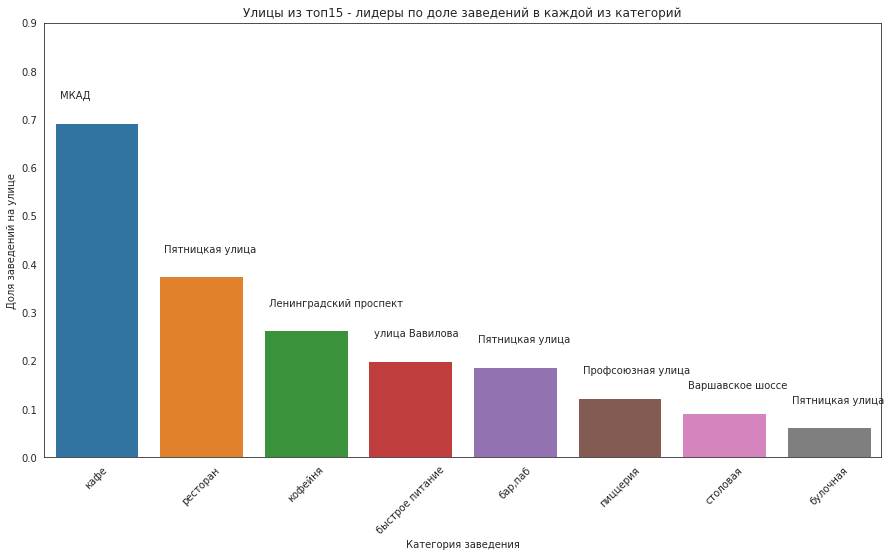

In [89]:
#строим график с информацией об улицах, которые лидируют по доле заведений определённой категории.
fig, ax = plt.subplots(figsize=(15,8))
ax = sns.barplot(data=df_top15_streets[df_top15_streets['rank_in_category'] ==1]
            .sort_values(by='category_proportion', ascending=False),
            x='category', y='category_proportion')

df_top15_streets[df_top15_streets['rank_in_category'] ==1].sort_values(by='category_proportion', ascending=False)['street']

for p, label in zip(ax.patches, df_top15_streets[df_top15_streets['rank_in_category'] ==1].sort_values(by='category_proportion', ascending=False)['street']):
    ax.annotate(label, (p.get_x()+0.05, p.get_height()+0.05))
ax.set_ylim(0, 0.9)
ax.set_title('Улицы из топ15 - лидеры по доле заведений в каждой из категорий')
ax.set_ylabel('Доля заведений на улице')
ax.set_xlabel('Категория заведения')
plt.xticks(rotation=45)

plt.show()

Среди топ-15 улиц по количеству точек общепита, `Пятницкая` улица вышла на первое место по доле заведений сразу в трёх категориях - `ресторан`, `бар.паб` и `булочная`. 

<a id="streets_only1rest"></a>

### Улицы с единственным заведением общепита

Добавим колонку с общим количеством заведений на улице.

In [90]:
#в каждую строку датасета добавляем информацию об общем количестве заведений на улице
df['num_of_rest_on_street'] = df.groupby('street')['name'].transform('count')

Посчитаем количество улиц с одним объектом.

In [91]:
print(f"Количество улиц, на которых находится только один объект общепита: \
{len(df[df['num_of_rest_on_street']==1])}")

Количество улиц, на которых находится только один объект общепита: 458


Выведем такие заведения на карту:

In [92]:
#выводим заведения, которые являются единственными на улице
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# определяем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df[df['num_of_rest_on_street']==1].apply(create_clusters, axis=1)

# выводим карту
m

In [93]:
print('Количество улиц с единственным объектом общепита в разрезе округов:')
display(df[df['num_of_rest_on_street']==1]['district'].value_counts())

Количество улиц с единственным объектом общепита в разрезе округов:


Центральный административный округ         145
Северо-Восточный административный округ     55
Северный административный округ             52
Восточный административный округ            52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64

Хотя улицы с единственным объектом общепита разбросаны по всему городу, но наибольшее их количество наблюдается в ЦАО.

При просмотре карты, на которую выведены единственные на улице объекты, можно заметить, что часто они находятся в переулках. Посчитаем частотность слов в названиях улиц с единственным заведением и в названиях улиц, где больше одного объекта.

In [94]:
print('Частотность слов в названиях улиц с единственным заведением:')
display(df[df['num_of_rest_on_street']==1]['street'].str.split().explode().value_counts().head(10))

Частотность слов в названиях улиц с единственным заведением:


улица         207
переулок      109
проезд         57
парк           22
2-й            20
1-й            20
Малый           9
2-я             9
набережная      8
3-й             7
Name: street, dtype: int64

In [95]:
print('Частотность слов в названиях улиц, где заведений больше одного:')
display(df[df['num_of_rest_on_street']>1]['street'].str.split().explode().value_counts().head(10))

Частотность слов в названиях улиц, где заведений больше одного:


улица         4706
проспект       956
шоссе          680
проезд         383
бульвар        338
переулок       330
Большая        252
Мира           184
площадь        177
набережная     170
Name: street, dtype: int64

Единственный объект общепита чаще можно обнаружить в переулках, проездах и парках.

Проверим, отличается ли распределение заведений по категориям между заведениями, которые являются единственными на улице, и теми, у которых есть соседние по улице точки общепита. 

In [96]:
# добавляем колонку с признаком, является ли заведение единственным на улице
# True- если единственное, False - если на улице больше одного заведения 
df['the_only_one'] = df['num_of_rest_on_street']==1

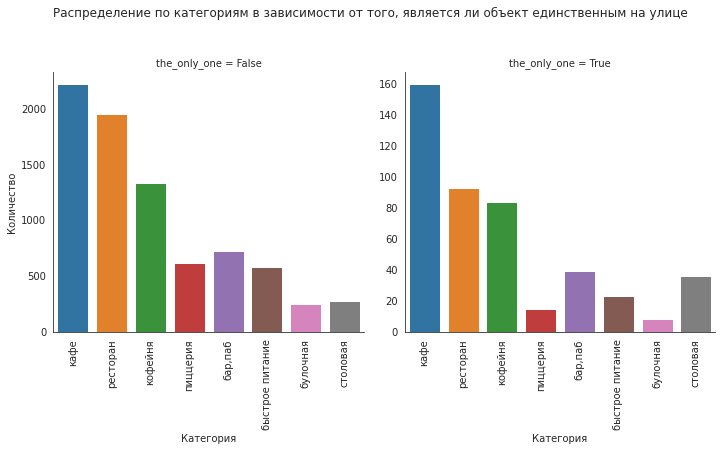

In [97]:
#строим графики распределения заведений по категориям
#в разрезе является ли заведение единственным на улице или нет
g = sns.catplot(data=df,
                x='category',
                kind='count',
                col='the_only_one',
                sharey=False)

g.fig.subplots_adjust(top=0.8) # adjust the Figure in rp
g.fig.suptitle('Распределение по категориям в зависимости от того, является ли объект единственным на улице')

g.set_ylabels('Количество')
g.set_xlabels('Категория')


g.set_xticklabels(rotation=90)
plt.show()

Распределение по категориям в целом похоже, лидерами являются кафе, рестораны и кофейни. Только в случае единственного заведения на улице, доля ресторанов и пиццерий поменьше, а столовых - побольше.  

Продемонстрируем эту же картину на круговом графике:

In [98]:
df_only1_grouped = ( df.groupby(['category', 'the_only_one'], as_index=False)
                    .agg(count=('name', 'count'))
                   )

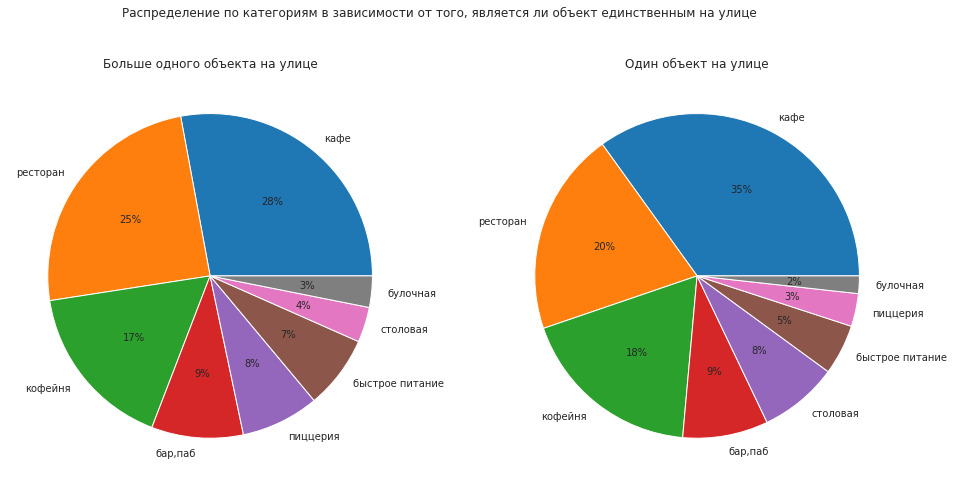

In [99]:
fig, axs = plt.subplots(1,2, figsize=(16,8))
#plt.Figure(figsize=())

ax1 = plt.subplot(1,2,1)
categories = (df_only1_grouped.sort_values(by=['the_only_one','count'], ascending=[True, False])
    .query('the_only_one==False')['count'])
##labels = df_only1_grouped[df_only1_grouped['the_only_one']==False]['category']
labels = (df_only1_grouped.sort_values(by=['the_only_one','count'], ascending=[True, False])
    .query('the_only_one==False')['category'])
ax1.pie(categories,
       labels = labels,
        autopct='%1.0f%%')
ax1.set_title("Больше одного объекта на улице")

ax2 = plt.subplot(1,2,2)
categories = (df_only1_grouped.sort_values(by=['the_only_one','count'], ascending=[True, False])
    .query('the_only_one==True')['count'])
##labels = df_only1_grouped[df_only1_grouped['the_only_one']==False]['category']
labels = (df_only1_grouped.sort_values(by=['the_only_one','count'], ascending=[True, False])
    .query('the_only_one==True')['category'])
ax2.pie(categories,
       labels = labels,
        autopct='%1.0f%%')

ax2.set_title("Один объект на улице")

fig.subplots_adjust(top=0.9) # adjust the Figure in rp
fig.suptitle('Распределение по категориям в зависимости от того, является ли объект единственным на улице')

plt.show()

Когда на улице только один объект, то с большей вероятностью это будет кафе.

<a id="avg_bill_by_districts"></a>

### Средний чек по районам города

Проверим, есть ли отличия в размере медианного значения среднего чека в различных округах города.

In [100]:
#посчитаем медиану средних чеков по районам города
df_bill_by_district = df.groupby('district', as_index=False).agg(median_bill=('middle_avg_bill', 'median'))

In [101]:
print('\nМедиана среднего чека в зависимости от района:')
display(df_bill_by_district.sort_values(by='median_bill', ascending=False))


Медиана среднего чека в зависимости от района:


,district,median_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


Построим картограмму, чтобы определить, как удалённость от центра влияет на цены. В качестве ценового индикатора возьмём полученные значения медиан средних чеков.

In [102]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_bill_by_district,
    columns=['district', 'median_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Средний чек по районам',
).add_to(m)

m

Самые высокие цены отмечены в Центральном и Западном административных округах. Наиболее демократичными ценами выделяются СВАО, ЮАО и ЮВАО.

Проверим, нет ли корреляции между переменными нашего датасета.

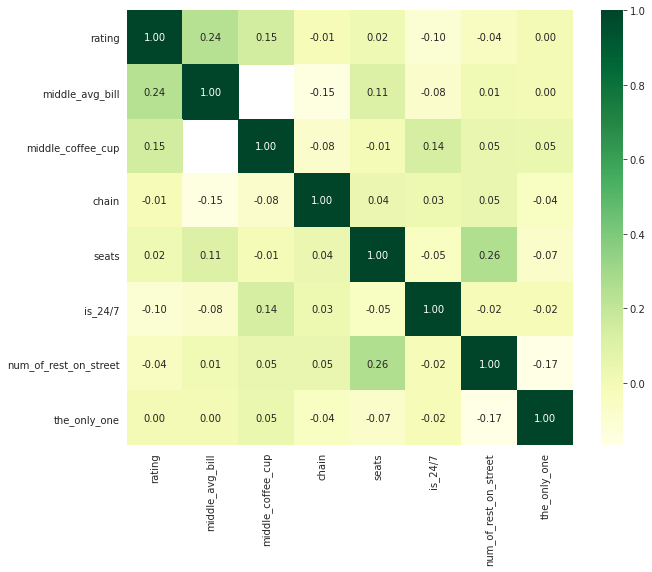

In [103]:
#выводим хитмэп по матрице корреляции
fig, ax = plt.subplots(figsize=(10,8))
sns.heatmap(data=
            df[['rating', 'middle_avg_bill', 'middle_coffee_cup', 'chain',
                'seats', 'is_24/7', 'num_of_rest_on_street', 'the_only_one']].corr(),
            cmap='YlGn', annot=True, fmt=".2f")

plt.show()

Между параметрами из нашего датасета не фиксируется тесных взаимосвязей. Коэффицент корреляции достигает значений 0.24 для рейтинга и среднего счета, и 0.26 для количества мест в заведении и количества ресторанов на улице, но такие значения коэффициента не говорят о наличии тесной линейной зависимости между указанными параметрами.

<a id="da_summary"></a>

### Выводы по разделу "Анализ рынка общепита в Москве"

В нашем датасете представлены данные по восьми типам заведений общественного питания.

- Первое место по количеству заведений в городе занимают `кафе`, следом идут `рестораны` и `кофейни`. Меньше всего в Москве `булочных` и `столовых`.

- Медианное значение количества посадочных мест находится в диапазоне от 50 - для булочных, до 86 мест - для ресторанов. Наибольшее количество посадочных мест обычно наблюдается в `ресторанах`, `барах` и `кофейнях`, а наименьшее в `пиццериях` и `булочных`.

- `38%` от общего количества объектов входят в состав сетей, а `62%` не являются сетевыми. Наибольшая доля сетевых заведений отмечена среди `булочных` - `60%`, `пиццерий` и `кофеен` - около `50%`, а наименьшая среди `баров и пабов` - `22%` и `столовых` - `28%`.

- Среди ТОП-15 сетей:
    - Наибольшее количество - 5 сетей, относится к `кофейням`, затем следуют `кафе` и `рестораны`, у которых по 3 представителя. 
    - Доля `кофеен` составляет около 40%, а затем идут `рестораны` и `пиццерии` с 18%-19%.
    - 97% заведений из ТОП-15 сетей относятся к среднему и низкому ценовому сегментам.
    - Заведения, входящие в сети из ТОП-15, реже работают круглосуточно.

- Из девяти административных округов города Москвы, лидером по количеству заведений является ЦАО. Меньше всего объектов общественного питания в СЗАО.
    - Внутри каждого из округов лидером по количеству заведений является категория `кафе`, за исключением ЦАО где лидируют `рестораны`.
    - Можно отметить большое количество `баров/пабов` в ЦАО, и их большую долю в сравнении с другими районами города.
    - К какой бы категории ни относился объект общепита, наибольшее их количество находится в ЦАО.
    - Внутри конкретного округа наибольшую долю заведений, относящихся к определённой категории, занимают: 
        - рестораны в ЦАО с долей 30%,
        - кафе в ЮВАО - 40%,
        - бары/пабы в ЦАО - 16%,
        - кофейни в САО - 21%,
        - столовые в ВАО - 5%,
        - булочные в ЗАО - 4.4%,
        - быстрое питание в ЮАО - 9.5%,
        - пиццерии в СЗАО - 9.8%,
- Для всех типов заведений средний рейтинг находится в диапазоне от 4 до 4,4 баллов, а медиана рейтинга - от 4,2 до 4,4 балла.
    - В лучшую сторону по значениям рейтинга выделяются `бары и пабы`, у которых медианный рейтинг составляет 4,4 балла,
    - Чуть хуже других по рейтингу категории `кафе` и `быстрое питание`, с медианным рейтингом 4,2 балла.
    - Остальные типы заведений близки по средним оценкам посетителей.

- По среднему рейтингу заведений первое место занимает Центральный административный округ с рейтингом 4,37 балла. Следом, на втором и третьем местах по среднему рейтингу, идут САО и СЗАО. Наименее рейтинговые заведения находятся в Юго-Восточном округе - 4,1 балла.

- В ТОП-15 улиц по количеству заведений в основном входят длинные радиальные шоссе и проспекты, которые тянутся от центра города в сторону МКАД, а также сама кольцевая дорога. Исключение составляют улица Миклухо-Маклая, которая расположена между проспектами, и Пятницкая улица, которая имеет протяженность менее 2 километров и не выходит за пределы Садового кольца.
- Среди топ-15 улиц по количеству точек общепита, Пятницкая улица вышла на первое место по доле заведений сразу в трёх категориях - ресторан, бар.паб и булочная.
- В городе есть 458 улиц с единственным объектом общепита и треть из них находится в Центральном округе. Среди таких улиц большую долю занимают переулки, проезды, парки и набережные.
- По среднему чеку самые высокие цены отмечены в ЦАО и ЗАО. Наиболее демократичными ценами выделяются СВАО, ЮАО и ЮВАО.



<a id="open_coffee_house"></a>

## Открытие кофейни

<a id="coffee_house_number_and_location"></a>

### Кофейни: количество и расположение

In [104]:
#определяем количество кофеен
num_coffee_house = len(df[df['category']=='кофейня'])

print(f"Всего кофеен в датасете: {num_coffee_house}")

Всего кофеен в датасете: 1413


Посмотрим на распределение кофеен по районам города.

In [105]:
df_coffee_grouped = (df[df['category']=='кофейня']
                     .groupby('district', as_index=False)
                     .agg(district_abb=('district_abb', 'first'), count=('name', 'count'))
                     .sort_values(by='count', ascending=False)
                    )

In [106]:
display(df_coffee_grouped)

,district,district_abb,count
5,Центральный административный округ,ЦАО,428
2,Северный административный округ,САО,193
3,Северо-Восточный административный округ,СВАО,159
1,Западный административный округ,ЗАО,150
8,Южный административный округ,ЮАО,131
0,Восточный административный округ,ВАО,105
7,Юго-Западный административный округ,ЮЗАО,96
6,Юго-Восточный административный округ,ЮВАО,89
4,Северо-Западный административный округ,СЗАО,62


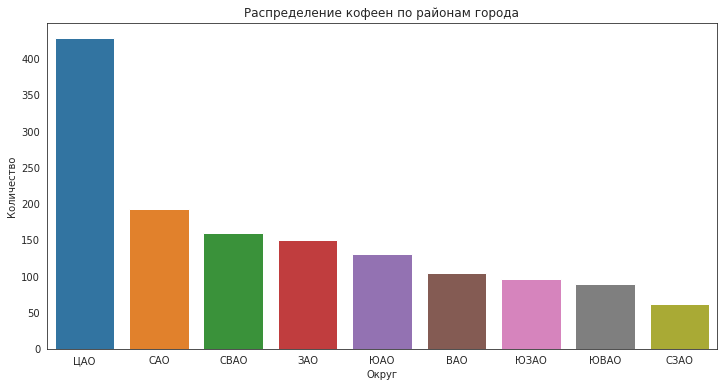

In [107]:
fig, ax = plt.subplots(figsize=(12,6))
ax = sns.countplot(data=df[df['category']=='кофейня'], x='district_abb',
                   order=df[df['category']=='кофейня']['district_abb'].value_counts().index)
ax.set_title('Распределение кофеен по районам города')
ax.set_xlabel('Округ')
ax.set_ylabel('Количество')

plt.show()

ЦАО является лидером по количеству кофеен, и опережает ближайших преследователей более чем в два раза. 

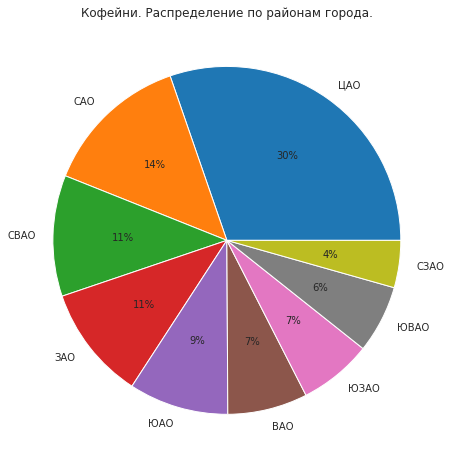

In [108]:
fig, ax = plt.subplots(figsize=(8,8))

districts = df[df['category']=='кофейня']['district_abb'].value_counts()

labels = df[df['category']=='кофейня']['district_abb'].value_counts().index
ax.pie(districts,
       labels = labels,
        autopct='%1.0f%%')
ax.set_title("Кофейни. Распределение по районам города.")

plt.show()

30% кофеен расположены в ЦАО. Следом идут САО, СВАО и ЗАО.

Выведем на карту все кофейни Москвы.

In [109]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# определяем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df[df['category']=='кофейня'].apply(create_clusters, axis=1)

Choropleth(
    geo_data=state_geo,
    data=df_coffee_grouped,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    legend_name='Рапределение по количеству кофеен в округах Москвы',
).add_to(m)

# выводим карту
m

<a id="coffee_house_chedule"></a>

### Кофейни: график работы

Проверим, есть ли круглосуточные кофейни.

In [110]:
num_coffee_house = len(df[df['category']=='кофейня'])
num_coffee_house_24_7 = len(df[(df['category']=='кофейня') & (df['is_24/7']==True)])

print(f"Всего кофеен: {num_coffee_house}")
print(f"из них круглосуточных: {num_coffee_house_24_7}")
print(f"Доля круглосуточных: {(num_coffee_house_24_7 / num_coffee_house):.2%}")

Всего кофеен: 1413
из них круглосуточных: 59
Доля круглосуточных: 4.18%


Круглосуточных кофеен немного, их доля около 4% от общего числа кофеен.
Посмотрим, в каких районах они встречаются.

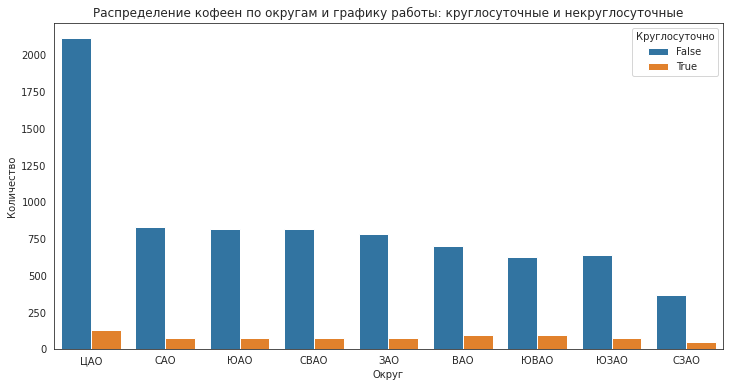

In [111]:
fig, ax = plt.subplots(figsize=(12,6))
ax = sns.countplot(data=df, x='district_abb', hue='is_24/7',
                   order=df['district_abb'].value_counts().index)
ax.set_title('Распределение кофеен по округам и графику работы: круглосуточные и некруглосуточные')
ax.set_xlabel('Округ')
ax.set_ylabel('Количество')
plt.legend(loc='upper right', title='Круглосуточно')

fig.show()

Хотя их доля невелика, но круглосуточную кофейню можно найти в любом округе.

Выясним, **кофейни с каким уровнем цен чаще работают круглосуточно** 

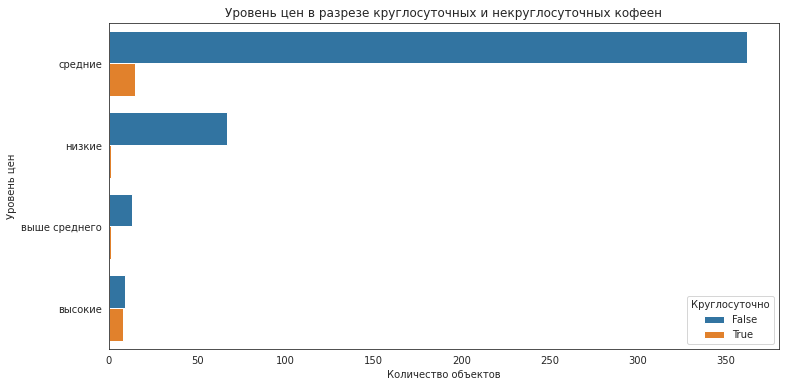

In [112]:
fig, ax = plt.subplots(figsize=(12,6))
sns.countplot(data=df[df['category']=='кофейня'], y='price', hue='is_24/7')
ax.set_title('Уровень цен в разрезе круглосуточных и некруглосуточных кофеен')
ax.set_ylabel('Уровень цен')
ax.set_xlabel('Количество объектов')
plt.legend(title='Круглосуточно')
plt.show()

Круглосуточные кофейни в основном имеют средний или высокий уровень цен, и крайне редко встречаются в сегментах с низким и выше среднего уровнем цен. 

<a id="coffee_house_price_level"></a>

### Кофейни: уровень цен по районам

Посмотрим на распределение кофеен в разрезе районов и уровня цен. 

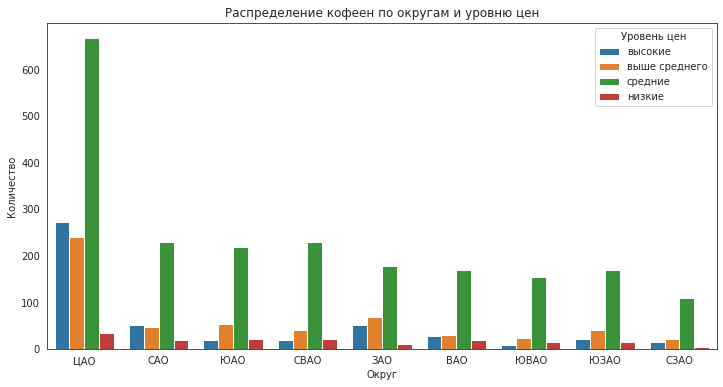

In [113]:
#распределение по районам и уровню цен
fig, ax = plt.subplots(figsize=(12,6))
ax = sns.countplot(data=df, x='district_abb', hue='price',
                   order=df['district_abb'].value_counts().index,
                   hue_order=['высокие', 'выше среднего', 'средние', 'низкие'])

ax.set_title('Распределение кофеен по округам и уровню цен')
ax.set_xlabel('Округ')
ax.set_ylabel('Количество')
plt.legend(title='Уровень цен')

fig.show()



Во всех районах большинство кофеен относятся к среднему ценовому диапазону. В самых дорогих по среднему чеку районах, ЦАО и ЗАО, количество кофеен с высоким и выше среднего уровнем цен превышает количество таких кофеен в других районах.


<a id="coffee_house_chedule_and_price_level"></a>

### Кофейни: средние рейтинги по районам

Выясним средний рейтинг кофеен в зависимости от района.

In [114]:
#считаем средний рейтинг кофеен в разрезе районов
df_rating_coffee_district = (df[df['category']=='кофейня']
                             .groupby('district', as_index=False)['rating']
                             .agg('mean')
                             .sort_values(by='rating', ascending=False)
)

In [115]:
display(df_rating_coffee_district)

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


In [116]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_rating_coffee_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

m

Разброс среднего рейтинга по районам не очень велик, разница между худшим округом по рейтингу кофеен - ЗАО, и лучшим - ЦАО, составляет менее 0,2 балла.  

<a id="coffee_house_coffee_cup"></a>

### Кофейни: средняя цена чашки кофе

Посмотрим на распределение цены чашки кофе в разрезе округов.

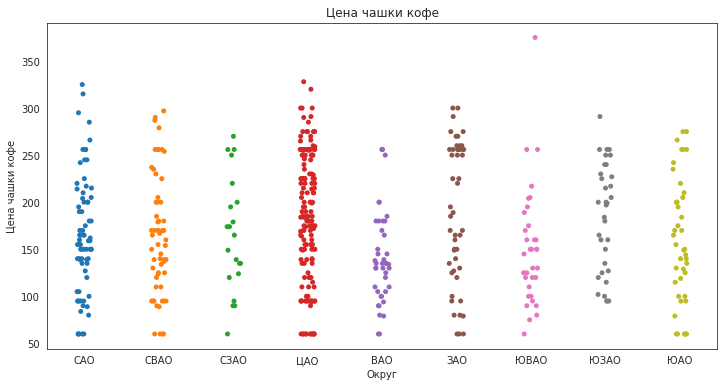

In [117]:
fig, ax = plt.subplots(figsize=(12,6))
sns.stripplot(x='district_abb', y='middle_coffee_cup', data=df[df['category']=='кофейня'])
ax.set_title('Цена чашки кофе')
ax.set_xlabel('Округ')
ax.set_ylabel('Цена чашки кофе')
plt.show()

Определим среднюю цену чашки кофе в разрезе административных округов.

In [118]:
df_price_coffee = (df[df['category']=='кофейня']
                   .groupby('district_abb', as_index=False)
                   .agg(cup_price_mean=('middle_coffee_cup', 'mean'), cup_price_median=('middle_coffee_cup', 'median'))
                   .sort_values(by='cup_price_mean', ascending=False)
                  )

In [119]:
display(df_price_coffee)

,district_abb,cup_price_mean,cup_price_median
1,ЗАО,189.938776,189.0
5,ЦАО,187.518519,190.0
8,ЮЗАО,184.176471,198.0
2,САО,165.789474,159.0
4,СЗАО,165.523810,165.0
3,СВАО,165.333333,162.5
6,ЮАО,158.488372,150.0
7,ЮВАО,151.088235,147.5
0,ВАО,142.785714,135.0


Построим диаграмму размаха цены чашки кофе в разрезе административных округов.

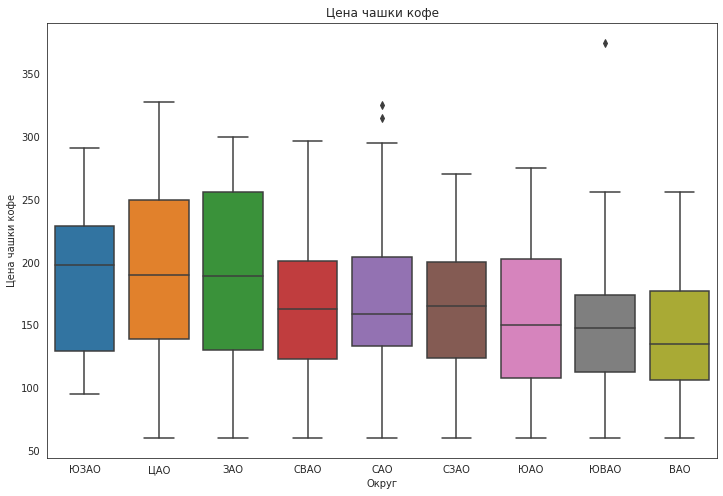

In [120]:
fig, ax = plt.subplots(figsize=(12,8))
sns.boxplot(x='district_abb', y='middle_coffee_cup', data=df[df['category']=='кофейня'],
            order = df.groupby('district_abb')
                        .agg({'middle_coffee_cup' : 'median'})
                        .sort_values(by='middle_coffee_cup', ascending=False)
                        .index
)
ax.set_title('Цена чашки кофе')
ax.set_xlabel('Округ')
ax.set_ylabel('Цена чашки кофе')
plt.show()

Интересно, что медианная стоимость чашки кофе наиболее высока в ЮЗАО

<a id="coffee_house_resume"></a>

### Выводы по разделу "Открытие кофейни"

В Москве открыто 1413 кофеен, из них 30% расположены в Центральном административном округе.

Некоторые кофейни работают круглосуточно, их можно найти в любом округе и в основном они имеют средний или высокий уровень цен, но доля круглосуточных кофеен не велика и составляет 4% от общего количества.

В каждом из районов большинство кофеен относятся к среднему ценовому диапазону. 
Кофейни с высоким и выше среднего уровнем цен чаще всего можно встретить в ЦАО и ЗАО.

По среднему рейтингу кофеен лидирует ЦАО - 4.33, отстаёт от всех ЗАО - 4.19. Районы, которые занимают первые два места по уровню цен оказались на разных полюсах по среднему рейтингу. 

По средней цене чашки кофе первые три места, с самой высокой ценой, занимают ЗАО, ЦАО и ЮЗАО. Медианная цена наиболее высока в ЮЗАО.

__При открытии новой кофейни:__ 

- в качестве локации можно рассмотреть:
    - ЗАО - где наиболее высока средняя цена чашки кофе и при этом невысокий средний рейтинг кофеен.
    - ЮЗАО - в котором доля кофеен одна из самых низких, около 13%, при этом самая высокая медианная цена чашки кофе.
    - если мы не боимся конкуренции, то можно подумать об открытии кофейни на Пятницкой улице в ЦАО. Это улица из ТОП-15 по количеству заведений, при этом доля кофеен на ней 12%, что немного меньше доли кофеен в среднем по округу - 19%. Кофейни в ЦАО имеют высокие показатели по рейтингу и средней цене чашки кофе, и наше новое заведение сможет равняться на лучшие кофейни города. 

- в качестве цены чашки кофе можно ориентироваться на диапазон 180-200 рублей, который близок к медианным значениям в рекомендованных округах.  


Отобразим на карте рекомендуемые локации для открытия кофейни.

In [121]:
#подготавливаем список районов, в котором в колонке recommend укажем:
#значение 1 для рекомендуемых районов и значение 0 для остальных районов

#группируем по названиям районов
df_districts_recommend= df.groupby('district', as_index=False).agg(recommend=('name', 'count'))

#заполняем колонку recommend нулями
df_districts_recommend['recommend'] = 0

#проставляем признак в значение 1 для рекомендуемых районов
(df_districts_recommend.loc[df_districts_recommend['district']
                            .isin(["Западный административный округ",
                                   "Центральный административный округ",
                                   "Юго-Западный административный округ"]), 'recommend']
)=1

#display(df_districts_recommend)

In [122]:
#выведем на карту рекомендуемые локации для кофейни
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# общий тип мест
place_type = 'Локация для кофейни'

# сохраняем координаты Пятницкой улицы в переменные
pyat_street_lat, pyat_street_lng = 55.739929, 37.628453

# сохраняем координаты рекомендуемых округов в переменные
uzao_lat, uzao_lng = 55.662735, 37.576187
zao_lat, zao_lng = 55.728003, 37.443533

# создаём маркер в точке расположения Пятницкой улицы и добавляем на карту
folium.Marker([pyat_street_lat, pyat_street_lng],\
              tooltip=place_type,\
              popup='Пятницкая улица')\
              .add_to(m)

# создаём маркер для uzao
folium.Marker([uzao_lat, uzao_lng],\
              tooltip=place_type,\
              popup='ЮЗАО')\
              .add_to(m)

# создаём маркер для zao
folium.Marker([zao_lat, zao_lng],\
              tooltip=place_type,\
              popup='ЗАО')\
              .add_to(m)



# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_districts_recommend,
    columns=['district', 'recommend'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.6,
    legend_name='Рекомендуемые локации для открытия кофейни',
).add_to(m)

m

<a id="link_to_the_presentation"></a>

## Ссылка на презентацию

[Презентация](https://storage.yandexcloud.net/for-ya-practicum-works/%D0%A0%D1%8B%D0%BD%D0%BE%D0%BA%20%D0%B7%D0%B0%D0%B2%D0%B5%D0%B4%D0%B5%D0%BD%D0%B8%D0%B9%20%D0%BE%D0%B1%D1%89%D0%B5%D1%81%D1%82%D0%B2%D0%B5%D0%BD%D0%BD%D0%BE%D0%B3%D0%BE%20%D0%BF%D0%B8%D1%82%D0%B0%D0%BD%D0%B8%D1%8F%20%D0%9C%D0%BE%D1%81%D0%BA%D0%B2%D1%8B%20(%D0%BB%D0%B5%D1%82%D0%BE%202022%D0%B3.)%20(2).pdf) в формате pdf.